In [19]:
import json
import pandas as pd, seaborn as sns, numpy as np, matplotlib.pyplot as plt
import scipy.stats as stats
from scipy.stats import norm

from collections import Counter
import nltk
import re
import sklearn.manifold
import multiprocessing
import gensim.models.word2vec as w2v

from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer, TfidfVectorizer
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.model_selection import learning_curve, train_test_split
from sklearn.model_selection import cross_val_score, cross_val_predict, ShuffleSplit
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.naive_bayes import MultinomialNB, BernoulliNB, GaussianNB
from sklearn.pipeline import Pipeline

import string
import nltk
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.tokenize import RegexpTokenizer
from wordcloud import WordCloud, STOPWORDS
import re

sns.set_style('whitegrid')

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

In [20]:
winemag_data_first150k = pd.read_csv('./winemag-data_first150k.csv')
winemag_data_130k_v2 = pd.read_csv('./winemag-data-130k-v2.csv')

In [21]:
data = pd.read_json('./winemag-data-130k-v2.json', dtype={
    'points': np.int32,
    'price': np.float32,})

In [22]:
labels = data['variety']
descriptions = data['description']
reviewers = data['taster_name']

In [23]:
print('{}   :   {}'.format(labels.tolist()[0], descriptions.tolist()[0]))
print('{}   :   {}'.format(labels.tolist()[56], descriptions.tolist()[56]))
print('{}   :   {}'.format(labels.tolist()[93], descriptions.tolist()[93]))

White Blend   :   Aromas include tropical fruit, broom, brimstone and dried herb. The palate isn't overly expressive, offering unripened apple, citrus and dried sage alongside brisk acidity.
Chardonnay   :   This is weighty, creamy and medium to full in body. It has plenty of lime and pear flavors, plus slight brown sugar and vanilla notes.
Grüner Veltliner   :   Freshness characterizes the nose: green pear, ivy leaves and citrus notes play on nose and palate. This is light footed, easy drinking and charming. Drink soon while flavors are fresh.


In [24]:
winemag_data_first150k.head(1)

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,variety,winery
0,0,US,This tremendous 100% varietal wine hails from ...,Martha's Vineyard,96,235.0,California,Napa Valley,Napa,Cabernet Sauvignon,Heitz


In [25]:
winemag_data_130k_v2.head(1)

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
0,0,Italy,"Aromas include tropical fruit, broom, brimston...",Vulkà Bianco,87,NaN,Sicily & Sardinia,Etna,NaN,Kerin O’Keefe,@kerinokeefe,Nicosia 2013 Vulkà Bianco (Etna),White Blend,Nicosia


In [26]:
data.head()

,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
0,Italy,"Aromas include tropical fruit, broom, brimston...",Vulkà Bianco,87,NaN,Sicily & Sardinia,Etna,None,Kerin O’Keefe,@kerinokeefe,Nicosia 2013 Vulkà Bianco (Etna),White Blend,Nicosia
1,Portugal,"This is ripe and fruity, a wine that is smooth...",Avidagos,87,15.0,Douro,None,None,Roger Voss,@vossroger,Quinta dos Avidagos 2011 Avidagos Red (Douro),Portuguese Red,Quinta dos Avidagos
2,US,"Tart and snappy, the flavors of lime flesh and...",None,87,14.0,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm
3,US,"Pineapple rind, lemon pith and orange blossom ...",Reserve Late Harvest,87,13.0,Michigan,Lake Michigan Shore,None,Alexander Peartree,None,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian
4,US,"Much like the regular bottling from 2012, this...",Vintner's Reserve Wild Child Block,87,65.0,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks


In [27]:
print(winemag_data_first150k.shape)
print(winemag_data_130k_v2.shape)
print(data.shape)

(150930, 11)
(129971, 14)
(129971, 13)


In [28]:
print("Total number of examples: ", data.shape[0])
print("Number of examples with the same title and description: ", data[data.duplicated(['description','title'])].shape[0])

Total number of examples:  129971
Number of examples with the same title and description:  9983


In [29]:
data=data.drop_duplicates(['description','title'])
data=data.reset_index(drop=True)

In [30]:
print(data.shape)

(119988, 13)


In [31]:
data['year'] = data['title'].str.extract('(20[0-2][0-9])', expand=True)

In [32]:
data.isnull().sum()

country                     59
description                  0
designation              34545
points                       0
price                     8395
province                    59
region_1                 19560
region_2                 73219
taster_name              24917
taster_twitter_handle    29446
title                        0
variety                      1
winery                       0
year                      5999
dtype: int64

In [33]:
data['year'] = data['year'].fillna(data['year'].mode()[0])
data['price'] = data['price'].fillna(data['price'].mode()[0])

In [34]:
data = data.drop(['taster_twitter_handle','region_2'], axis=1)

In [35]:
fill_value = {'taster_name': 'unknown',}
data = data.fillna(value=fill_value)

In [36]:
data.isnull().sum()

country           59
description        0
designation    34545
points             0
price              0
province          59
region_1       19560
taster_name        0
title              0
variety            1
winery             0
year               0
dtype: int64

In [37]:
data["year"] = data["year"].astype('float64')

In [38]:
# data=data.dropna(subset=['price'])

In [39]:
# data=data.fillna(-1)

In [40]:
data=data.dropna()

In [41]:
data.shape

(69331, 12)

In [42]:
varietal_counts = labels.value_counts()
print(varietal_counts[:50])

Pinot Noir                       13272
Chardonnay                       11753
Cabernet Sauvignon                9472
Red Blend                         8946
Bordeaux-style Red Blend          6915
Riesling                          5189
Sauvignon Blanc                   4967
Syrah                             4142
Rosé                              3564
Merlot                            3102
Nebbiolo                          2804
Zinfandel                         2714
Sangiovese                        2707
Malbec                            2652
Portuguese Red                    2466
White Blend                       2360
Sparkling Blend                   2153
Tempranillo                       1810
Rhône-style Red Blend             1471
Pinot Gris                        1455
Champagne Blend                   1396
Cabernet Franc                    1353
Grüner Veltliner                  1345
Portuguese White                  1159
Bordeaux-style White Blend        1066
Pinot Grigio             

In [43]:
data.nunique()

country            7
description    69317
designation    31002
points            21
price            297
province          65
region_1        1135
taster_name       18
title          68496
variety          480
winery         10703
year              18
dtype: int64

In [44]:
data.count()

country        69331
description    69331
designation    69331
points         69331
price          69331
province       69331
region_1       69331
taster_name    69331
title          69331
variety        69331
winery         69331
year           69331
dtype: int64

In [45]:
data['taster_name'].nunique()

18

In [46]:
data[data['taster_name']=='Kerin O’Keefe']

,country,description,designation,points,price,province,region_1,taster_name,title,variety,winery,year
0,Italy,"Aromas include tropical fruit, broom, brimston...",Vulkà Bianco,87,20.0,Sicily & Sardinia,Etna,Kerin O’Keefe,Nicosia 2013 Vulkà Bianco (Etna),White Blend,Nicosia,2013.0
6,Italy,"Here's a bright, informal red that opens with ...",Belsito,87,16.0,Sicily & Sardinia,Vittoria,Kerin O’Keefe,Terre di Giurfo 2013 Belsito Frappato (Vittoria),Frappato,Terre di Giurfo,2013.0
13,Italy,This is dominated by oak and oak-driven aromas...,Rosso,87,20.0,Sicily & Sardinia,Etna,Kerin O’Keefe,Masseria Setteporte 2012 Rosso (Etna),Nerello Mascalese,Masseria Setteporte,2012.0
22,Italy,Delicate aromas recall white flower and citrus...,Ficiligno,87,19.0,Sicily & Sardinia,Sicilia,Kerin O’Keefe,Baglio di Pianetto 2007 Ficiligno White (Sicilia),White Blend,Baglio di Pianetto,2007.0
24,Italy,"Aromas of prune, blackcurrant, toast and oak c...",Aynat,87,35.0,Sicily & Sardinia,Sicilia,Kerin O’Keefe,Canicattì 2009 Aynat Nero d'Avola (Sicilia),Nero d'Avola,Canicattì,2009.0
26,Italy,Pretty aromas of yellow flower and stone fruit...,Dalila,87,13.0,Sicily & Sardinia,Terre Siciliane,Kerin O’Keefe,Stemmari 2013 Dalila White (Terre Siciliane),White Blend,Stemmari,2013.0
28,Italy,"Aromas suggest mature berry, scorched earth, a...",Mascaria Barricato,87,17.0,Sicily & Sardinia,Cerasuolo di Vittoria,Kerin O’Keefe,Terre di Giurfo 2011 Mascaria Barricato (Cera...,Red Blend,Terre di Giurfo,2011.0
61,Italy,This densely hued wine has aromas of black plu...,Prugneto,86,17.0,Central Italy,Romagna,Kerin O’Keefe,Podere dal Nespoli 2015 Prugneto Sangiovese (R...,Sangiovese,Podere dal Nespoli,2015.0
72,Italy,"Aromas of black-skinned fruit, leather, underb...",Daginestra,86,32.0,Southern Italy,Aglianico del Vulture,Kerin O’Keefe,Grifalco 2013 Daginestra (Aglianico del Vulture),Aglianico,Grifalco,2013.0
88,Italy,"Subdued aromas of French oak, toast and acacia...",Le Mandorle Riserva,86,29.0,Tuscany,Vernaccia di San Gimignano,Kerin O’Keefe,Poggio Alloro 2014 Le Mandorle Riserva (Verna...,Vernaccia,Poggio Alloro,2014.0


In [47]:
data[data['taster_name']=='Roger Voss']

,country,description,designation,points,price,province,region_1,taster_name,title,variety,winery,year
9,France,This has great depth of flavor with its fresh ...,Les Natures,87,27.0,Alsace,Alsace,Roger Voss,Jean-Baptiste Adam 2012 Les Natures Pinot Gris...,Pinot Gris,Jean-Baptiste Adam,2012.0
30,France,Red cherry fruit comes laced with light tannin...,Nouveau,86,20.0,Beaujolais,Beaujolais-Villages,Roger Voss,Domaine de la Madone 2012 Nouveau (Beaujolais...,Gamay,Domaine de la Madone,2012.0
42,France,"This is a festive wine, with soft, ripe fruit ...",Nouveau,86,9.0,Beaujolais,Beaujolais,Roger Voss,Henry Fessy 2012 Nouveau (Beaujolais),Gamay,Henry Fessy,2012.0
49,France,"Soft and fruity, this is a generous, ripe wine...",Eté Indien,86,14.0,Beaujolais,Brouilly,Roger Voss,Vignerons de Bel Air 2011 Eté Indien (Brouilly),Gamay,Vignerons de Bel Air,2011.0
53,France,"Fruity and lightly herbaceous, this has fine t...",La Fleur d'Amélie,85,15.0,Bordeaux,Bordeaux Blanc,Roger Voss,Château de Sours 2011 La Fleur d'Amélie (Bord...,Bordeaux-style White Blend,Château de Sours,2011.0
63,France,"This fat, yeasty Champagne is comprised predom...",Brut Rosé,86,58.0,Champagne,Champagne,Roger Voss,Roland Champion NV Brut Rosé (Champagne),Champagne Blend,Roland Champion,2012.0
69,France,"This cooperative, based in Aÿ, has benefited f...",Brut Rosé,86,55.0,Champagne,Champagne,Roger Voss,Collet NV Brut Rosé (Champagne),Champagne Blend,Collet,2012.0
82,France,"This fruity, sweet wine is immediately attract...",La Réserve,86,11.0,France Other,Vin de France,Roger Voss,Lionel Osmin & Cie 2016 La Réserve Petit Manse...,Petit Manseng,Lionel Osmin & Cie,2016.0
110,France,Produced from cru vines at the base of Mount B...,Les Quartelets,87,23.0,Beaujolais,Brouilly,Roger Voss,Pardon et Fils 2015 Les Quartelets (Brouilly),Gamay,Pardon et Fils,2015.0
163,France,Produced from vineyards donated to a charitabl...,Hospices Civils de Romanèche Thurins,91,20.0,Beaujolais,Moulin-à-Vent,Roger Voss,Collin-Bourisset 2011 Hospices Civils de Roman...,Gamay,Collin-Bourisset,2011.0


In [48]:
reviewers_counts = reviewers.value_counts()
print(reviewers_counts[:])

Roger Voss            25514
Michael Schachner     15134
Kerin O’Keefe         10776
Virginie Boone         9537
Paul Gregutt           9532
Matt Kettmann          6332
Joe Czerwinski         5147
Sean P. Sullivan       4966
Anna Lee C. Iijima     4415
Jim Gordon             4177
Anne Krebiehl MW       3685
Lauren Buzzeo          1835
Susan Kostrzewa        1085
Mike DeSimone           514
Jeff Jenssen            491
Alexander Peartree      415
Carrie Dykes            139
Fiona Adams              27
Christina Pickard         6
Name: taster_name, dtype: int64


In [49]:
# data[pd.isnull(data).any(axis=1)]

,country,description,designation,points,price,province,region_1,taster_name,title,variety,winery,year


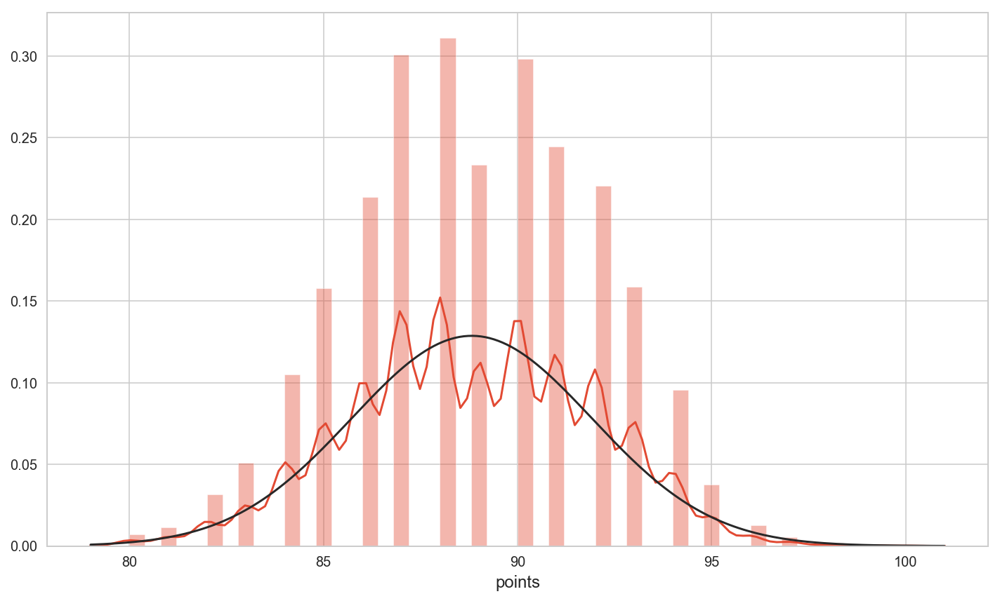

<Figure size 432x288 with 0 Axes>

In [50]:
import warnings
warnings.filterwarnings('ignore')

fig = plt.figure(figsize=(12, 7))
sns.distplot(data['points'], fit=norm)

# plt.legend(['Normal dist',loc='best')
# plt.ylabel('Frequency')
# plt.title('SalePrice distribution Plot')

fig = plt.figure()
plt.show()

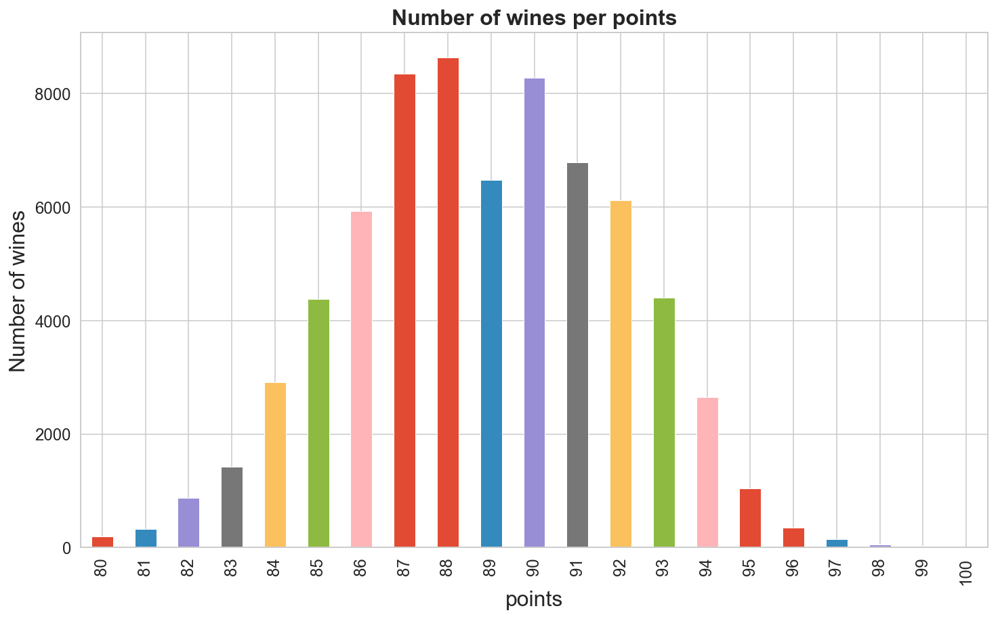

In [51]:
fig, ax = plt.subplots(figsize=(12, 7))
plt.xticks(fontsize=12) # X Ticks
plt.yticks(fontsize=12) # Y Ticks
ax.set_title('Number of wines per points', fontweight="bold", size=16) # Title
ax.set_ylabel('Number of wines', fontsize = 16) # Y label
ax.set_xlabel('Points', fontsize = 16) # X label
data.groupby(['points']).count()['description'].plot(ax=ax, kind='bar')

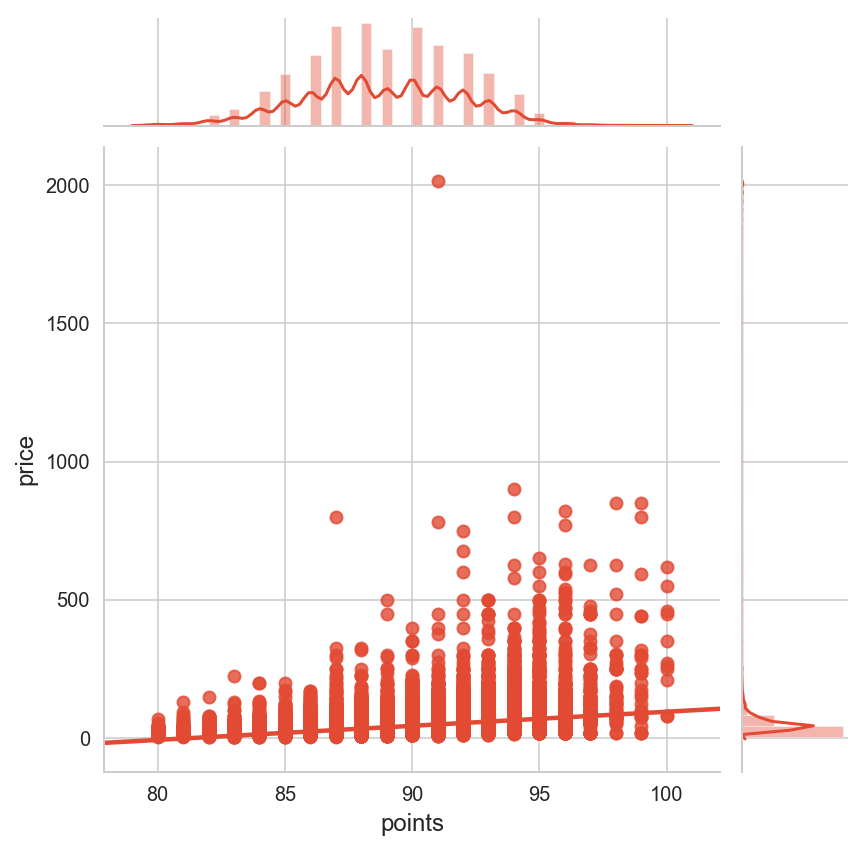

In [52]:
warnings.filterwarnings('ignore')

sns.jointplot(x=data['points'], y=data['price'], kind='reg')
plt.show()

In [53]:
prices = data['price'].dropna()
prices.shape

(69331,)

In [54]:
data[(data['price'] > 2200)]

,country,description,designation,points,price,province,region_1,taster_name,title,variety,winery,year


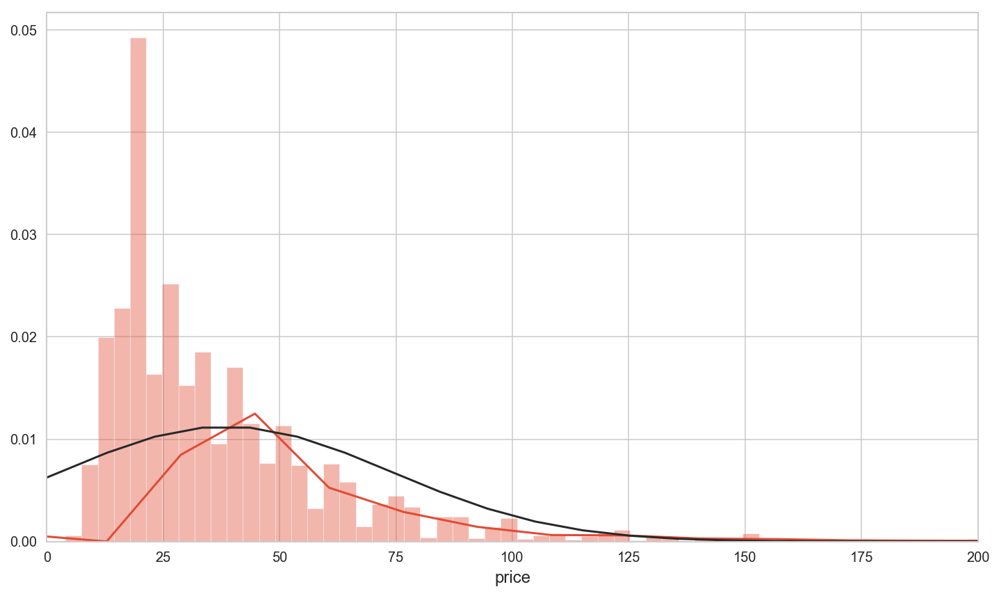

<Figure size 432x288 with 0 Axes>

In [55]:
warnings.filterwarnings('ignore')

fig = plt.figure(figsize=(12, 7))
sns.distplot(prices, 580, fit=norm)

# there are outliers in the prices and this is to limit it to $200
axes = plt.gca()
axes.set_xlim([0,200])

fig = plt.figure()
plt.show()

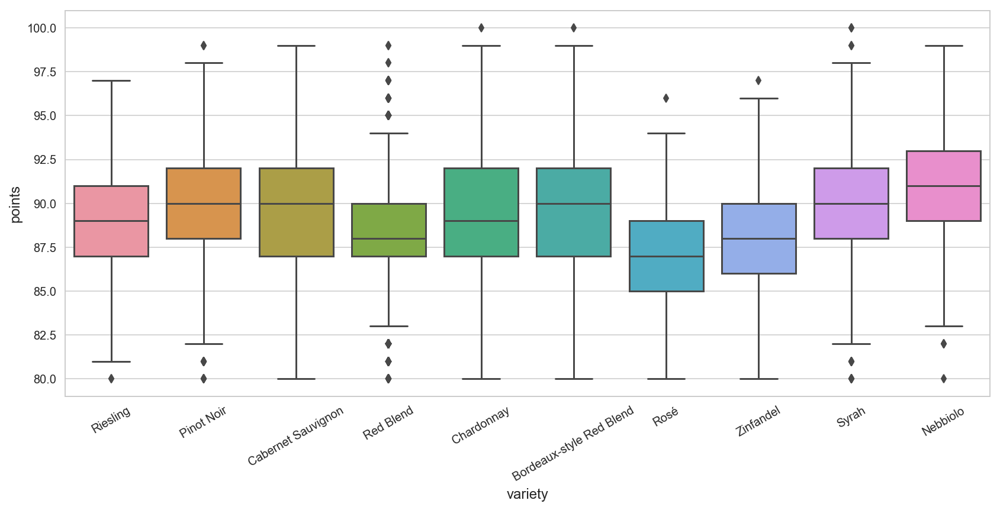

In [56]:
df1= data[data.variety.isin(data.variety.value_counts().head(10).index)]

plt.figure(figsize = (14,6))
plt.xticks(rotation=30)
sns.boxplot(
    x = 'variety',
    y = 'points',
    data = df1)

In [57]:
# extracting the year from the title to a new column

# data['year'] = data['title'].str.extract('(20[0-2][0-9])', expand=True)

# data['year'] = pd.DatetimeIndex(data['title']).year #need proper date to work
# data["year"] = data.title.str.extract("(\d*\.?\d+)", expand=True) #extract the first set of numbers only

In [58]:
years = data['year']
year_counts = years.value_counts()
print(year_counts[:])

2012.0    12955
2013.0     8202
2014.0     7758
2010.0     6613
2011.0     6492
2009.0     5365
2015.0     4437
2008.0     4126
2007.0     3896
2006.0     3260
2005.0     2231
2016.0     1596
2004.0     1152
2003.0      371
2000.0      353
2001.0      312
2002.0      206
2017.0        6
Name: year, dtype: int64


In [59]:
data.isnull().sum()

country        0
description    0
designation    0
points         0
price          0
province       0
region_1       0
taster_name    0
title          0
variety        0
winery         0
year           0
dtype: int64

In [60]:
years = data['year'].dropna()
years.shape

(69331,)

In [ ]:
# data["year"] = data["year"].astype('float64')

In [ ]:
# create csv file to take a quick look at the strange year number origin - problem settled

# column_order = ["country", "description", "designation", "points", "price", "province", 
#                 "region_1", "region_2", "taster_name", "taster_twitter_handle", "title", 
#                 "variety", "winery", "year"]

# data[column_order].to_csv('wine_mid_eda.csv')

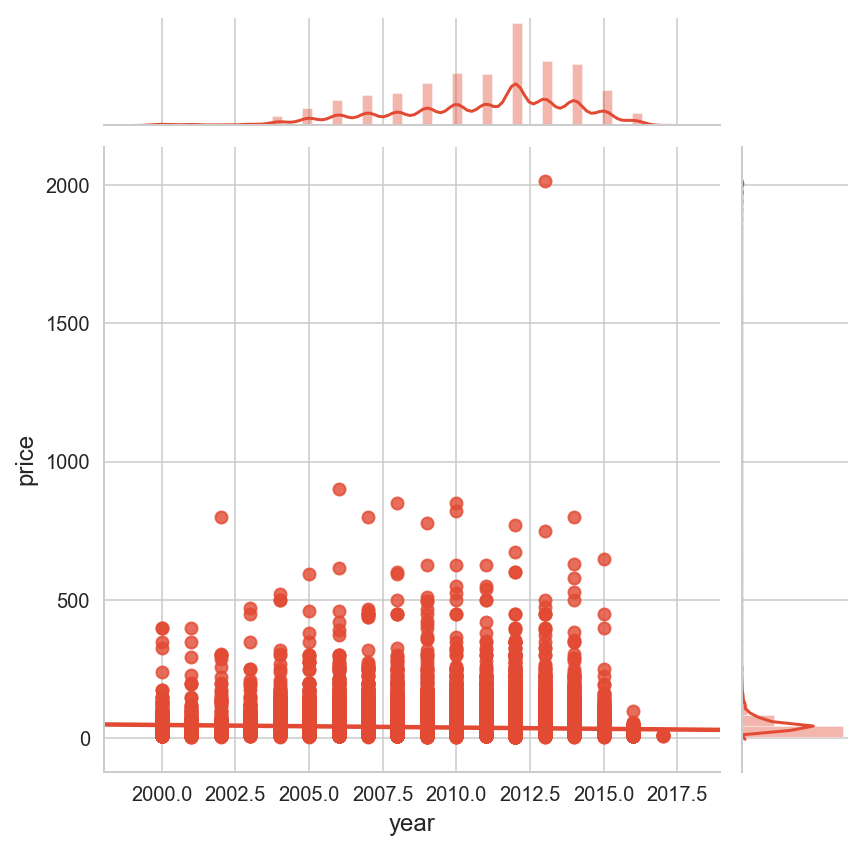

In [61]:
warnings.filterwarnings('ignore')

sns.jointplot(x=data['year'], y=data['price'], kind='reg')

plt.show()

In [62]:
prices = data['price']
prices_counts = prices.value_counts()
print(prices_counts[:])

20.0      7748
25.0      2924
30.0      2737
15.0      2640
40.0      2467
35.0      2308
50.0      2294
18.0      2252
45.0      2176
22.0      1691
60.0      1601
28.0      1558
16.0      1556
24.0      1461
55.0      1412
12.0      1396
13.0      1372
17.0      1288
14.0      1275
19.0      1215
10.0      1187
32.0      1156
65.0      1111
38.0      1105
75.0      1016
48.0       975
42.0       955
26.0       910
36.0       863
23.0       784
          ... 
357.0        1
183.0        1
292.0        1
222.0        1
196.0        1
617.0        1
273.0        1
197.0        1
203.0        1
310.0        1
269.0        1
420.0        1
510.0        1
234.0        1
419.0        1
206.0        1
2013.0       1
750.0        1
194.0        1
157.0        1
675.0        1
212.0        1
530.0        1
476.0        1
580.0        1
252.0        1
279.0        1
238.0        1
187.0        1
540.0        1
Name: price, Length: 297, dtype: int64


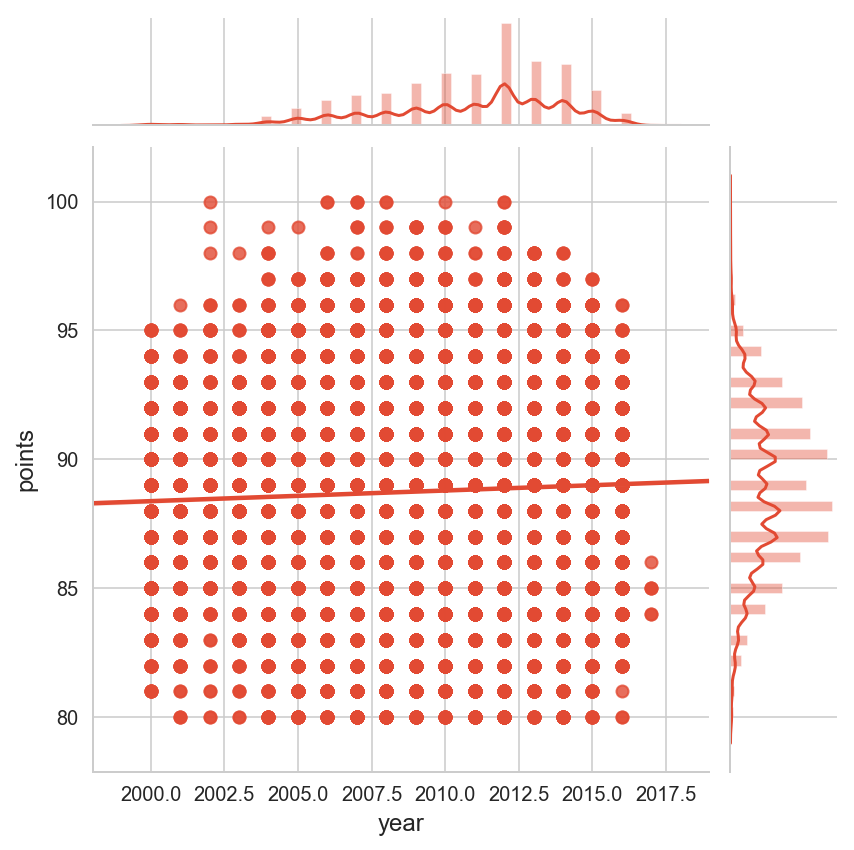

In [63]:
warnings.filterwarnings('ignore')

sns.jointplot(x=data['year'], y=data['points'], kind='reg')

plt.show()

### Understanding from people who review wine and what makes a good wine
https://winefolly.com/review/what-is-wine/

https://www.quickanddirtytips.com/house-home/entertaining/wine/4-ways-to-know-if-your-wine-is-good

https://winefolly.com/review/the-science-behind-great-wine/

https://www.marketviewliquor.com/blog/2018/08/how-to-choose-a-good-wine/

In [64]:
tasters = data.groupby('taster_name')['points'].apply(list)

In [65]:
print(tasters)

taster_name
Alexander Peartree    [87, 87, 85, 87, 87, 87, 88, 88, 84, 83, 84, 8...
Anna Lee C. Iijima    [88, 87, 87, 89, 89, 89, 89, 90, 90, 87, 86, 8...
Anne Krebiehl MW      [82, 92, 92, 92, 92, 92, 92, 92, 90, 90, 90, 8...
Carrie Dykes          [85, 86, 86, 86, 86, 86, 87, 85, 85, 89, 88, 8...
Christina Pickard                                              [93, 89]
Fiona Adams                            [91, 89, 88, 88, 86, 82, 86, 85]
Jim Gordon            [90, 89, 89, 91, 93, 93, 92, 90, 91, 90, 90, 9...
Joe Czerwinski        [86, 86, 92, 87, 90, 85, 92, 100, 98, 97, 97, ...
Kerin O’Keefe         [87, 87, 87, 87, 87, 87, 87, 86, 86, 86, 88, 8...
Lauren Buzzeo         [85, 90, 87, 93, 89, 90, 93, 86, 86, 86, 88, 8...
Matt Kettmann         [87, 86, 87, 87, 87, 87, 91, 91, 91, 91, 91, 9...
Michael Schachner     [87, 87, 87, 87, 91, 90, 90, 85, 85, 85, 89, 8...
Paul Gregutt          [87, 86, 86, 85, 85, 85, 89, 89, 92, 87, 95, 9...
Roger Voss            [87, 86, 86, 86, 85, 86, 86, 8

In [66]:
tasters.dtypes

dtype('O')

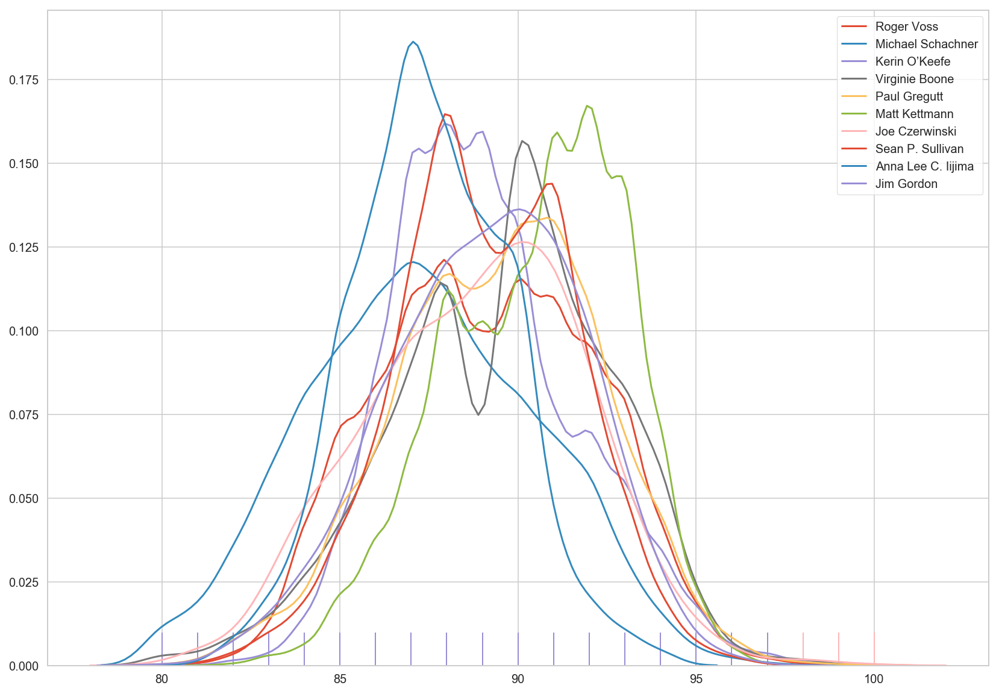

In [67]:
# Alexander_Peartree - 0
# Anna_Lee_C_Iijima  - 1
# Anne_Krebiehl_MW   - 2
# Carrie_Dykes       - 3  
# Christina_Pickard  - 4   
# Fiona_Adams        - 5  
# Jeff_Jenssen       - -------   
# Jim_Gordon         - 6  
# Joe_Czerwinski     - 7
# Kerin_O_Keefe      - 8
# Lauren_Buzzeo      - 9
# Matt_Kettmann      - 10
# Michael_Schachner  - 11
# Mike_DeSimone      - --------
# Paul_Gregutt       - 12
# Roger_Voss         - 13
# Sean_P_Sullivan    - 14
# Susan_Kostrzewa    - 15
# Virginie_Boone     - 16

# Top ten reviewers
# Roger Voss            25514
# Michael Schachner     15134
# Kerin O’Keefe         10776
# Virginie Boone         9537
# Paul Gregutt           9532
# Matt Kettmann          6332
# Joe Czerwinski         5147
# Sean P. Sullivan       4966
# Anna Lee C. Iijima     4415
# Jim Gordon             4177

fig = plt.figure(figsize=(14, 10))

sns.distplot(tasters[13], hist=False, rug=True, label='Roger Voss')
sns.distplot(tasters[11], hist=False, rug=True, label='Michael Schachner')
sns.distplot(tasters[8], hist=False, rug=True, label='Kerin O’Keefe')
sns.distplot(tasters[16], hist=False, rug=True, label='Virginie Boone')
sns.distplot(tasters[12], hist=False, rug=True, label='Paul Gregutt')
sns.distplot(tasters[10], hist=False, rug=True, label='Matt Kettmann')
sns.distplot(tasters[7], hist=False, rug=True, label='Joe Czerwinski')
sns.distplot(tasters[14], hist=False, rug=True, label='Sean P. Sullivan')
sns.distplot(tasters[1], hist=False, rug=True, label='Anna Lee C. Iijima')
sns.distplot(tasters[6], hist=False, rug=True, label='Jim Gordon')
ax.set_title('Wine Score')
plt.legend()
# sns.plt.show()

In [68]:
data.head()

,country,description,designation,points,price,province,region_1,taster_name,title,variety,winery,year
0,Italy,"Aromas include tropical fruit, broom, brimston...",Vulkà Bianco,87,20.0,Sicily & Sardinia,Etna,Kerin O’Keefe,Nicosia 2013 Vulkà Bianco (Etna),White Blend,Nicosia,2013.0
3,US,"Pineapple rind, lemon pith and orange blossom ...",Reserve Late Harvest,87,13.0,Michigan,Lake Michigan Shore,Alexander Peartree,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian,2013.0
4,US,"Much like the regular bottling from 2012, this...",Vintner's Reserve Wild Child Block,87,65.0,Oregon,Willamette Valley,Paul Gregutt,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks,2012.0
5,Spain,Blackberry and raspberry aromas show a typical...,Ars In Vitro,87,15.0,Northern Spain,Navarra,Michael Schachner,Tandem 2011 Ars In Vitro Tempranillo-Merlot (N...,Tempranillo-Merlot,Tandem,2011.0
6,Italy,"Here's a bright, informal red that opens with ...",Belsito,87,16.0,Sicily & Sardinia,Vittoria,Kerin O’Keefe,Terre di Giurfo 2013 Belsito Frappato (Vittoria),Frappato,Terre di Giurfo,2013.0


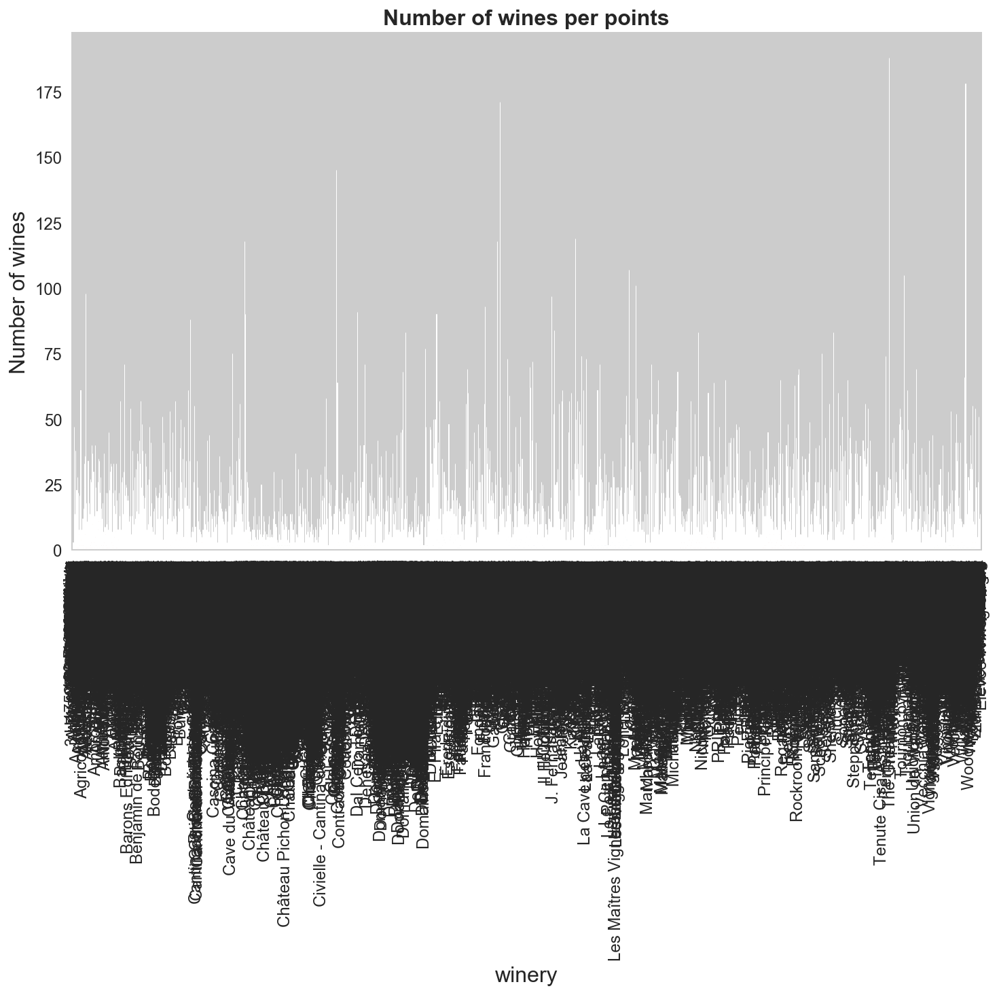

In [69]:
fig, ax = plt.subplots(figsize=(12, 7))
plt.xticks(fontsize=12) # X Ticks
plt.yticks(fontsize=12) # Y Ticks
ax.set_title('Number of wines per points', fontweight="bold", size=16) # Title
ax.set_ylabel('Number of wines', fontsize = 16) # Y label
ax.set_xlabel('winery', fontsize = 16) # X label
data.groupby(['winery']).count()['description'].plot(ax=ax, kind='bar')

In [70]:
data = data.assign(description_length = data['description'].apply(len))
data.info()
data.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69331 entries, 0 to 119987
Data columns (total 13 columns):
country               69331 non-null object
description           69331 non-null object
designation           69331 non-null object
points                69331 non-null int32
price                 69331 non-null float32
province              69331 non-null object
region_1              69331 non-null object
taster_name           69331 non-null object
title                 69331 non-null object
variety               69331 non-null object
winery                69331 non-null object
year                  69331 non-null float64
description_length    69331 non-null int64
dtypes: float32(1), float64(1), int32(1), int64(1), object(9)
memory usage: 6.9+ MB


,country,description,designation,points,price,province,region_1,taster_name,title,variety,winery,year,description_length
0,Italy,"Aromas include tropical fruit, broom, brimston...",Vulkà Bianco,87,20.0,Sicily & Sardinia,Etna,Kerin O’Keefe,Nicosia 2013 Vulkà Bianco (Etna),White Blend,Nicosia,2013.0,172
3,US,"Pineapple rind, lemon pith and orange blossom ...",Reserve Late Harvest,87,13.0,Michigan,Lake Michigan Shore,Alexander Peartree,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian,2013.0,199
4,US,"Much like the regular bottling from 2012, this...",Vintner's Reserve Wild Child Block,87,65.0,Oregon,Willamette Valley,Paul Gregutt,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks,2012.0,249
5,Spain,Blackberry and raspberry aromas show a typical...,Ars In Vitro,87,15.0,Northern Spain,Navarra,Michael Schachner,Tandem 2011 Ars In Vitro Tempranillo-Merlot (N...,Tempranillo-Merlot,Tandem,2011.0,261
6,Italy,"Here's a bright, informal red that opens with ...",Belsito,87,16.0,Sicily & Sardinia,Vittoria,Kerin O’Keefe,Terre di Giurfo 2013 Belsito Frappato (Vittoria),Frappato,Terre di Giurfo,2013.0,181


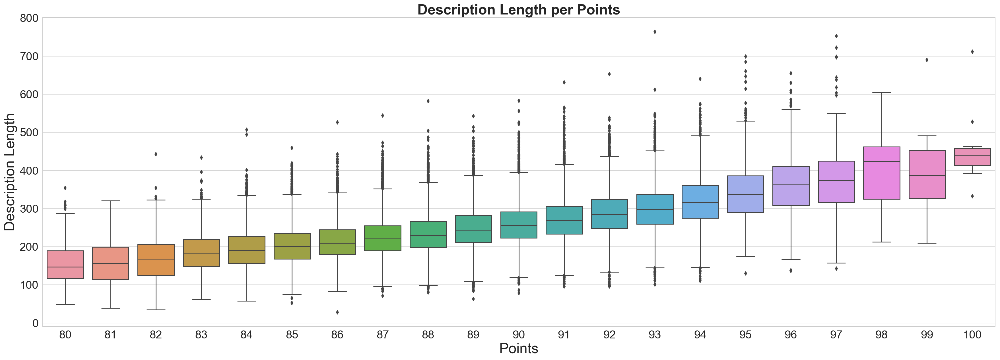

In [71]:
fig, ax = plt.subplots(figsize=(30,10))
sns.boxplot(x='points', y='description_length', data=data)
plt.xticks(fontsize=20) # X Ticks
plt.yticks(fontsize=20) # Y Ticks
ax.set_title('Description Length per Points', fontweight="bold", size=25) # Title
ax.set_ylabel('Description Length', fontsize = 25) # Y label
ax.set_xlabel('Points', fontsize = 25) # X label
plt.show()

The description length of the wine generally show a linear progression with points


Wine points classification https://www.winemag.com/2019/01/02/wine-vintage-chart-2019/
- 5-   98-100 Classsic
- 4-   94-97  Superb
- 3-   90-93  Excellent
- 2-   87-89  Very Good
- 1-   83-86  Good
- 0-   80-82  Acceptable

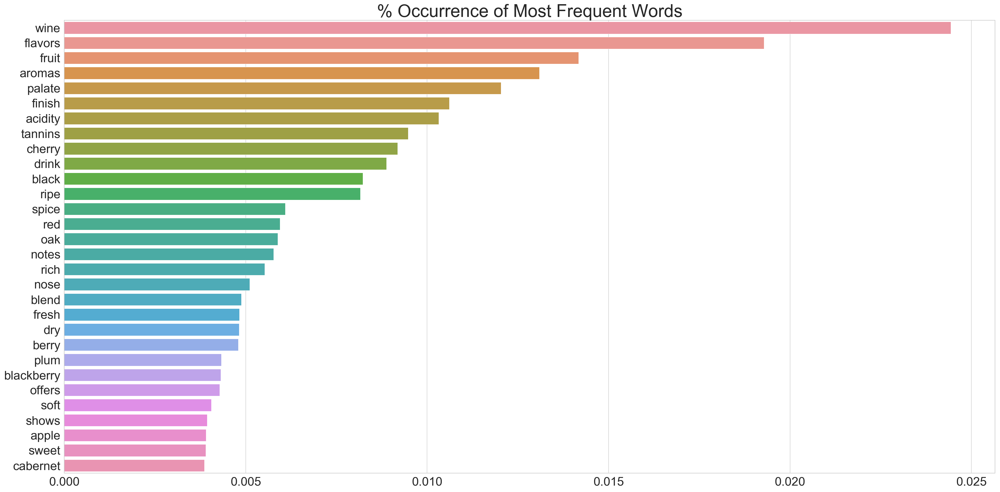

In [83]:
import seaborn as sns 
import matplotlib.pyplot as plt
from nltk.tokenize.treebank import TreebankWordDetokenizer
from nltk.corpus import stopwords
from nltk import word_tokenize

fig, ax = plt.subplots(figsize=(30,15))
plt.rcParams.update({'font.size': 22})
plt.rc('xtick', labelsize=20) 
plt.rc('ytick', labelsize=20) 

stopwords = set(stopwords.words('english'))
# Detokenizer combines tokenized elements
detokenizer = TreebankWordDetokenizer()

def clean_description(desc):
    desc = word_tokenize(desc.lower())
    desc = [token for token in desc if token not in stopwords and token.isalpha()]
    return detokenizer.detokenize(desc)

data["cleaned_description"] = data["description"].apply(clean_description)
word_occurrence = data["cleaned_description"].str.split(expand=True).stack().value_counts()
total_words = sum(word_occurrence)

# plot most common words 

top_words = word_occurrence[:30]/total_words
ax = sns.barplot(x = top_words.values, y = top_words.index)

# Setting title 
ax.set_title("% Occurrence of Most Frequent Words")
plt.show()

In [103]:
def points_to_class(points):
    if points in range(80,83):
        return 0
    elif points in range(83,87):
        return 1
    elif points in range(87,90):
        return 2
    elif points in range(90,94):
        return 3
    elif points in range(94,98):
        return 4
    else:
        return 5
    
data["rating"] = data["points"].apply(points_to_class)

In [104]:
ratings = data["rating"]
ratings_counts = ratings.value_counts()
print(ratings_counts[:])

3    25578
2    23446
1    14631
4     4187
0     1402
5       87
Name: rating, dtype: int64


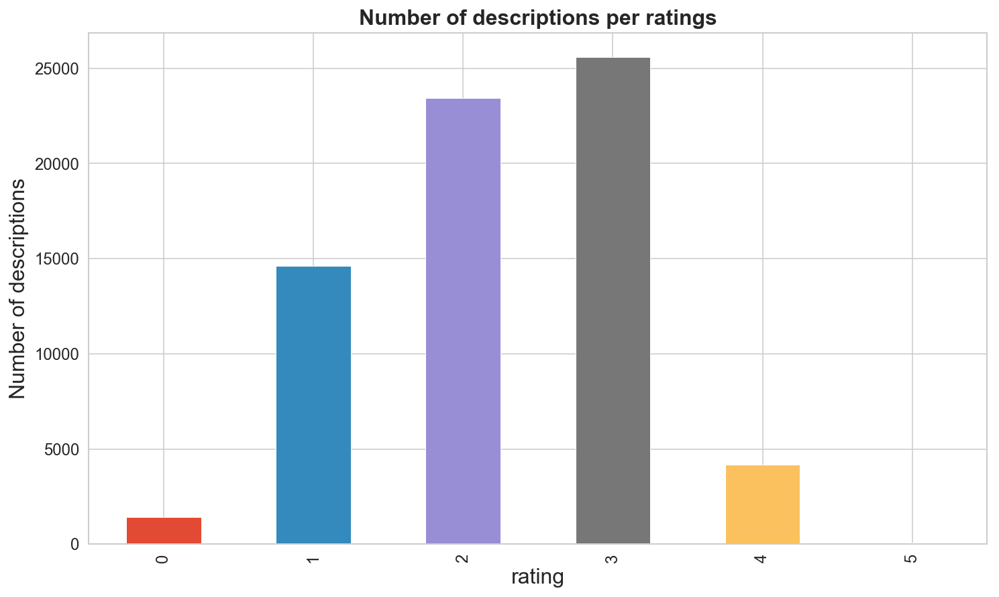

In [105]:
fig, ax = plt.subplots(figsize=(12, 7))
plt.xticks(fontsize=12) # X Ticks
plt.yticks(fontsize=12) # Y Ticks
ax.set_title('Number of descriptions per ratings', fontweight="bold", size=16) # Title
ax.set_ylabel('Number of descriptions', fontsize = 16) # Y label
ax.set_xlabel('rating', fontsize = 16) # X label
data.groupby(['rating']).count()['description'].plot(ax=ax, kind='bar')

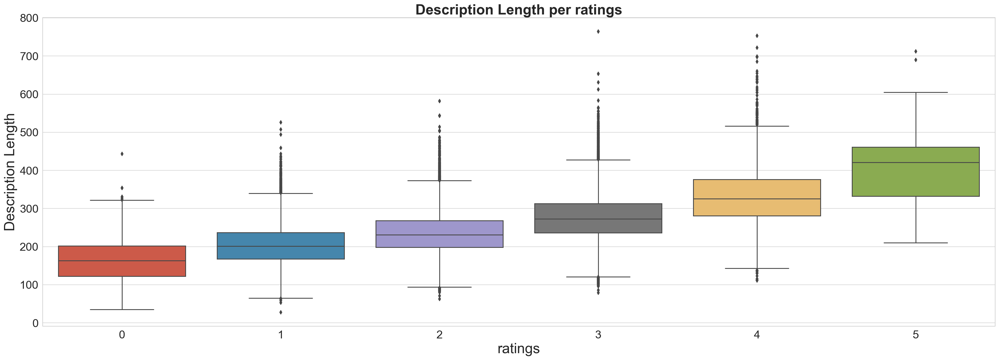

In [106]:
fig, ax = plt.subplots(figsize=(30,10))
sns.boxplot(x='rating', y='description_length', data=data)
plt.xticks(fontsize=20) # X Ticks
plt.yticks(fontsize=20) # Y Ticks
ax.set_title('Description Length per ratings', fontweight="bold", size=25) # Title
ax.set_ylabel('Description Length', fontsize = 25) # Y label
ax.set_xlabel('ratings', fontsize = 25) # X label
plt.show()

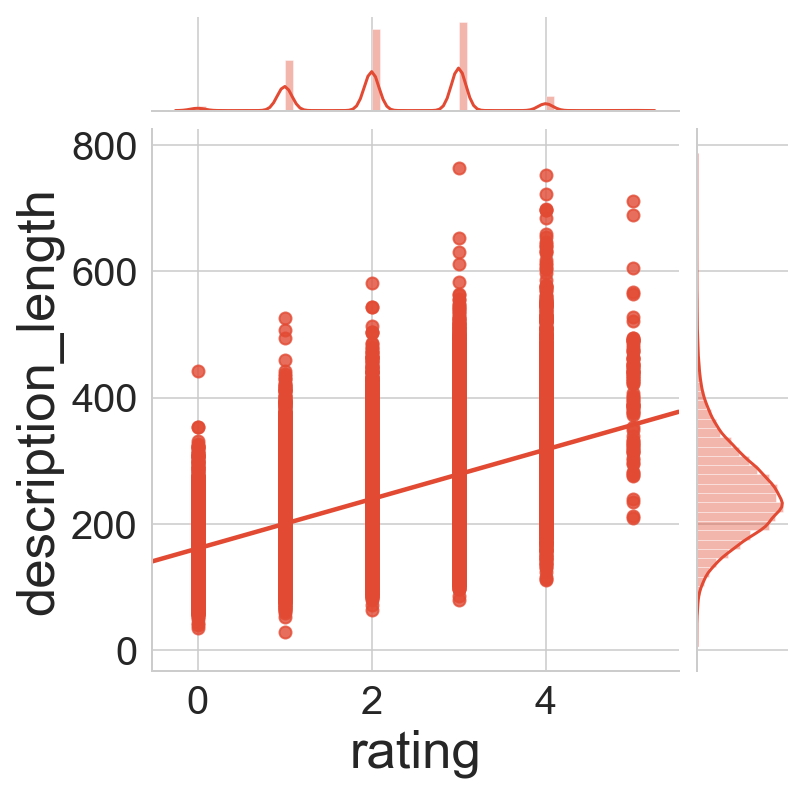

In [107]:
warnings.filterwarnings('ignore')

sns.jointplot(x=data['rating'], y=data['description_length'], kind='reg')
plt.show()

In [108]:
X = data['description']
y = data['rating']

vectorizer = CountVectorizer()
vectorizer.fit(X)

CountVectorizer(analyzer='word', binary=False, decode_error='strict',
        dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
        lowercase=True, max_df=1.0, max_features=None, min_df=1,
        ngram_range=(1, 1), preprocessor=None, stop_words=None,
        strip_accents=None, token_pattern='(?u)\\b\\w\\w+\\b',
        tokenizer=None, vocabulary=None)

In [109]:
X = vectorizer.transform(X)
print('Shape of Sparse Matrix: ', X.shape)
print('Amount of Non-Zero occurrences: ', X.nnz)
# Percentage of non-zero values
density = (100.0 * X.nnz / (X.shape[0] * X.shape[1]))
print('Density: {}'.format((density)))

Shape of Sparse Matrix:  (69331, 25249)
Amount of Non-Zero occurrences:  2441329
Density: 0.13946160641219266


In [110]:
# Training the model
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=101)
rfc = RandomForestClassifier()
rfc.fit(X_train, y_train)

# Testing the model
predictions = rfc.predict(X_test)
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       0.40      0.10      0.16       117
           1       0.52      0.52      0.52      1527
           2       0.45      0.51      0.48      2324
           3       0.57      0.62      0.60      2517
           4       0.36      0.01      0.02       436
           5       0.00      0.00      0.00        13

   micro avg       0.51      0.51      0.51      6934
   macro avg       0.38      0.29      0.30      6934
weighted avg       0.50      0.51      0.49      6934



In [111]:
X = data['description']
y = data['rating']

# Vectorizing model
vectorizer = TfidfVectorizer()
vectorizer.fit(X)
X = vectorizer.transform(X)

In [112]:
# Training model
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=101)
rfc = RandomForestClassifier()
rfc.fit(X_train, y_train)

# Testing model
predictions = rfc.predict(X_test)
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       0.50      0.05      0.09       117
           1       0.51      0.49      0.50      1527
           2       0.46      0.48      0.47      2324
           3       0.55      0.66      0.60      2517
           4       0.38      0.01      0.03       436
           5       0.00      0.00      0.00        13

   micro avg       0.51      0.51      0.51      6934
   macro avg       0.40      0.28      0.28      6934
weighted avg       0.50      0.51      0.49      6934



In [ ]:
# data.head()

In [ ]:
# data.shape

In [67]:
# data_no_nan = data.dropna()
# data_no_nan.shape

(69331, 13)

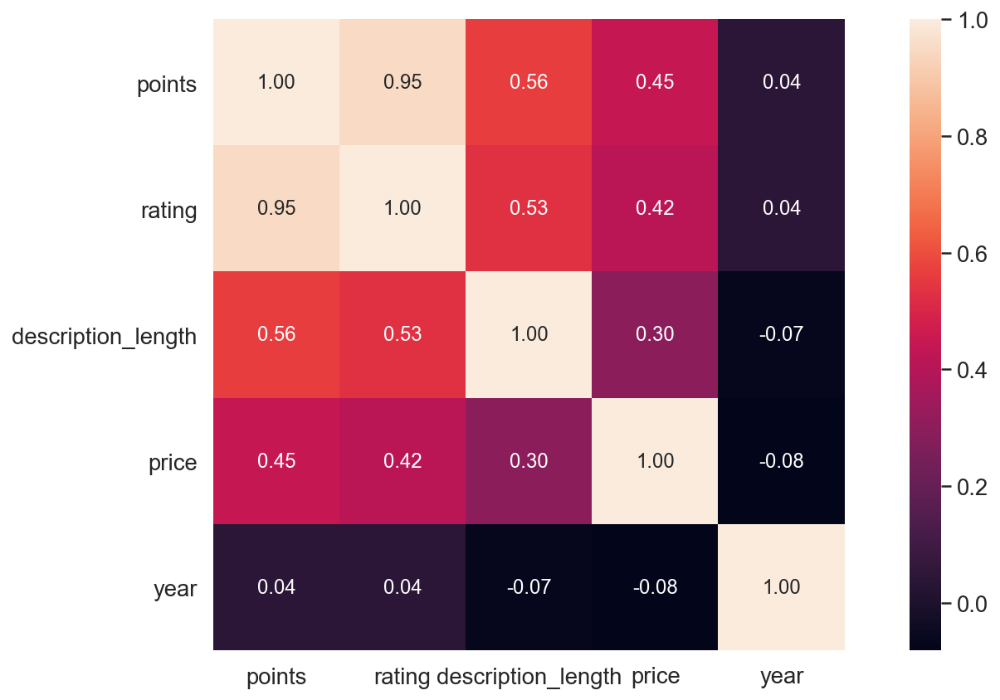

In [113]:
data_corr = data.corr()
# data_corr = data.corr()

plt.figure(figsize=(14,7))

kd = 10 #max number of variables for heatmap
colsd = data_corr.nlargest(kd, 'points')['points'].index
cmd = np.corrcoef(data[colsd].values.T)
# cmd = np.corrcoef(data[colsd].values.T)
sns.set(font_scale=1.25)
hmd = sns.heatmap(cmd, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 12}, 
                 yticklabels=colsd.values, xticklabels=colsd.values)
plt.show()

In [114]:
# MLR model predicting price
import statsmodels.api as sm

# Setting my X and y for modeling
X = data['description_length']
y = data['rating']

# The Default here is Linear Regression (ordinary least squares regression OLS)
model = sm.OLS(y,X).fit()

y_pred = model.predict(X)

In [115]:
data['y_pred'] = y_pred
data['Residuals'] = data['rating'] - data['y_pred']

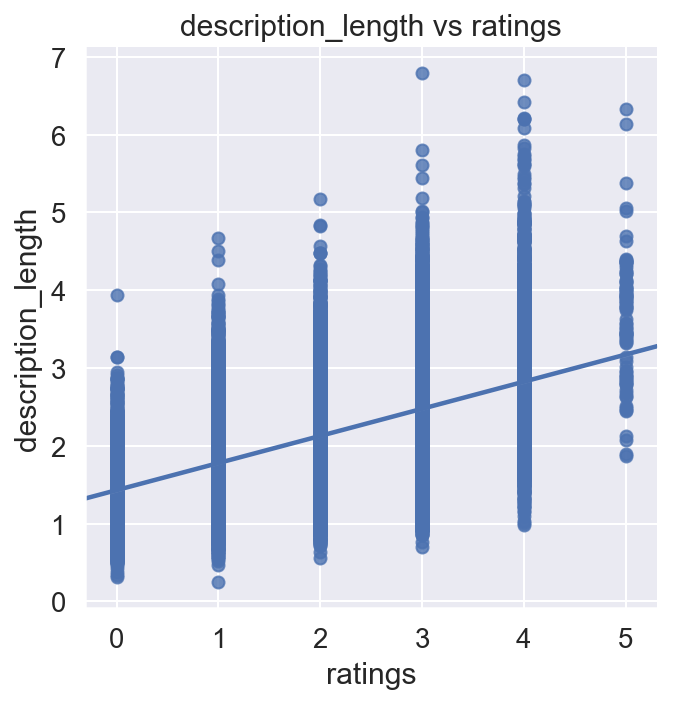

In [118]:
sns.lmplot(x='rating', y='y_pred', data=data)
plt.xlabel('ratings')
plt.ylabel('description_length')
plt.title('description_length vs ratings')

plt.show()

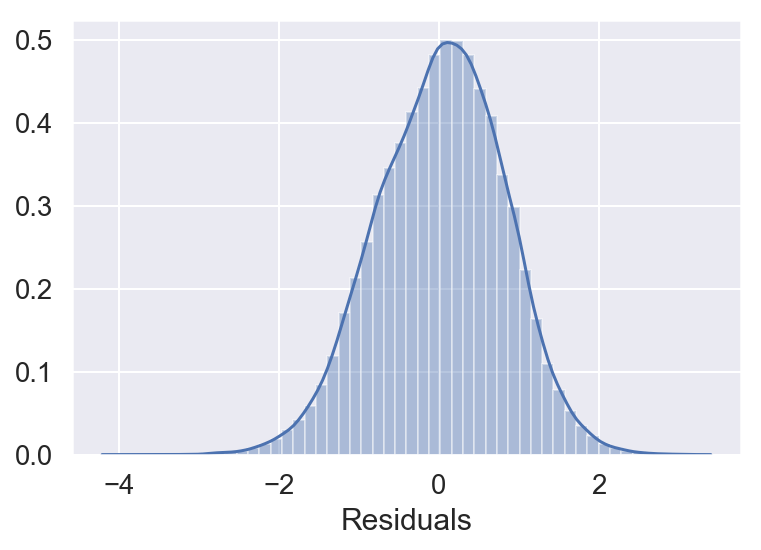

In [119]:
sns.distplot(data['Residuals'])
plt.show()

In [120]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 rating   R-squared:                       0.894
Model:                            OLS   Adj. R-squared:                  0.894
Method:                 Least Squares   F-statistic:                 5.831e+05
Date:                Sat, 09 Mar 2019   Prob (F-statistic):               0.00
Time:                        04:47:52   Log-Likelihood:                -82083.
No. Observations:               69331   AIC:                         1.642e+05
Df Residuals:                   69330   BIC:                         1.642e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
description_length     0.0089   1.16e-05    763.623      0.000       0.009       0.009
==============================================================================
Omnibus:                      231.930   Durbin-Watson:                   0.791
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              234.153
Skew:                          -0.142   Prob(JB):                     1.43e-51
Kurtosis:                       2.973   Cond. No.                         1.00
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Train Test Cross Validation with Linear Regression using limited columns

In [121]:
X = data
y = data.rating

In [122]:
X.columns

Index(['country', 'description', 'designation', 'points', 'price', 'province',
       'region_1', 'taster_name', 'title', 'variety', 'winery', 'year',
       'description_length', 'cleaned_description', 'rating', 'y_pred',
       'Residuals'],
      dtype='object')

In [123]:
# selection independent variables
predictors = ['description_length','price','year']
# create train and test sets (50/50)
X_train, X_test, y_train, y_test = train_test_split(X[predictors], 
                                                    y, 
                                                    train_size=0.5, 
                                                    random_state=8)

In [124]:
# set model
lr = LinearRegression()
# fit model using train data
lr.fit(X_train, y_train)
# score the fit model using the test data.
lr.score(X_test, y_test)

0.3528608329767311

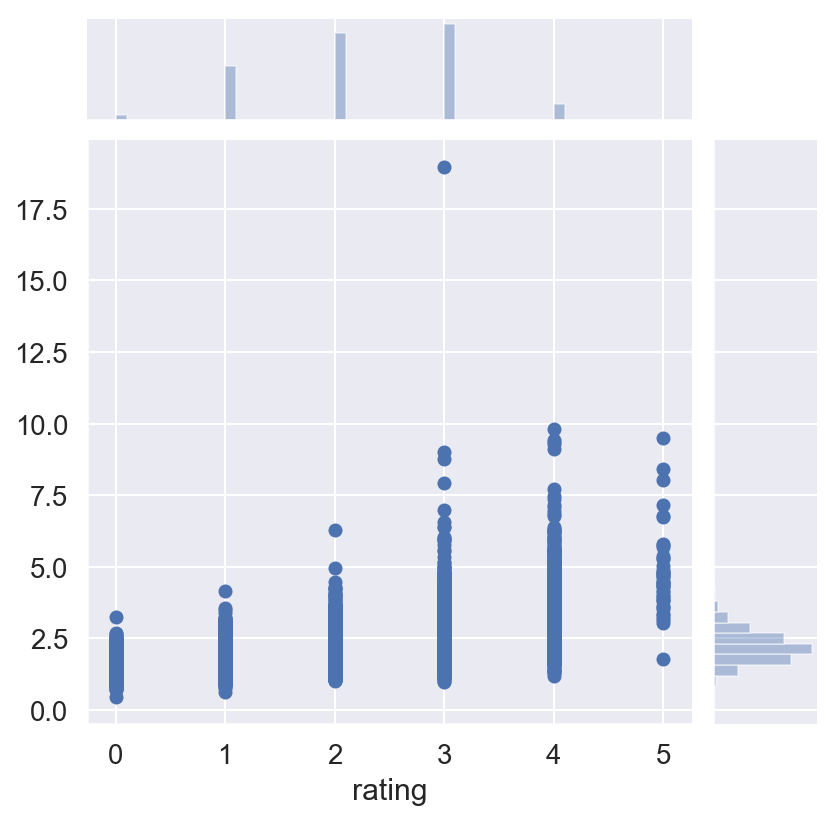

In [125]:
# plot y-true, vs. y-pred
yhat = lr.predict(X_test)
sns.jointplot(y_test, yhat)

In [126]:
# 70/30 Train/test Split

X_train, X_test, y_train, y_test = train_test_split(X[predictors], 
                                                    y, 
                                                    train_size=0.78, 
                                                    random_state=8)

lr2 = LinearRegression()
# Fit the model
lr2.fit(X_train,y_train)
# Calculate R2 for the test set
lr2.score(X_test, y_test)

0.35781626512792103

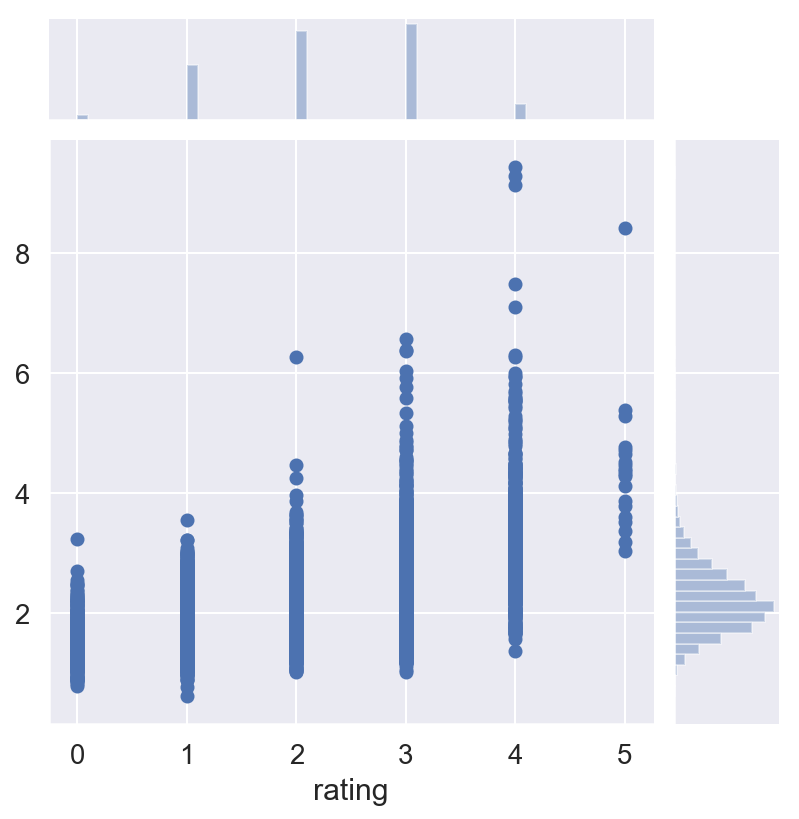

In [127]:
yhat = lr.predict(X_test)
sns.jointplot(y_test, yhat)

In [128]:
from sklearn import metrics

# iterate through folds 5-12
for folds in range(5,12+1):
    print( '--------------------------------------\n')
    print('K:', folds)
    model = LinearRegression()
    
    # Perform cross-validation
    scores = cross_val_score(model, X[predictors], y, cv=folds)
    print("Cross-validated scores:", scores)
    print("Mean CV R2:", np.mean(scores))
    print('Std CV R2:', np.std(scores))
    
    # Make cross-validated predictions
    predictions = cross_val_predict(model, X[predictors], y, cv=folds)
    
    r2 = metrics.r2_score(y, predictions)
    print("Cross-Predicted R2:", r2)

--------------------------------------

K: 5
Cross-validated scores: [0.35946692 0.36932823 0.3278911  0.38685872 0.37520043]
Mean CV R2: 0.36374907950666946
Std CV R2: 0.020002238188691908
Cross-Predicted R2: 0.3646262852905112
--------------------------------------

K: 6
Cross-validated scores: [0.37587283 0.34170909 0.36589956 0.34839174 0.36896568 0.38265889]
Mean CV R2: 0.3639162981847166
Std CV R2: 0.014478976995698034
Cross-Predicted R2: 0.3646770026656593
--------------------------------------

K: 7
Cross-validated scores: [0.38088819 0.34001034 0.36863007 0.32228653 0.38439012 0.3617219
 0.38115059]
Mean CV R2: 0.3627253927381463
Std CV R2: 0.0217973884777109
Cross-Predicted R2: 0.36456378289237634
--------------------------------------

K: 8
Cross-validated scores: [0.37583482 0.33908121 0.36026345 0.36936413 0.32569717 0.39783204
 0.34945246 0.38500365]
Mean CV R2: 0.36281611821201804
Std CV R2: 0.022519518358992914
Cross-Predicted R2: 0.3647284695493316
--------------------

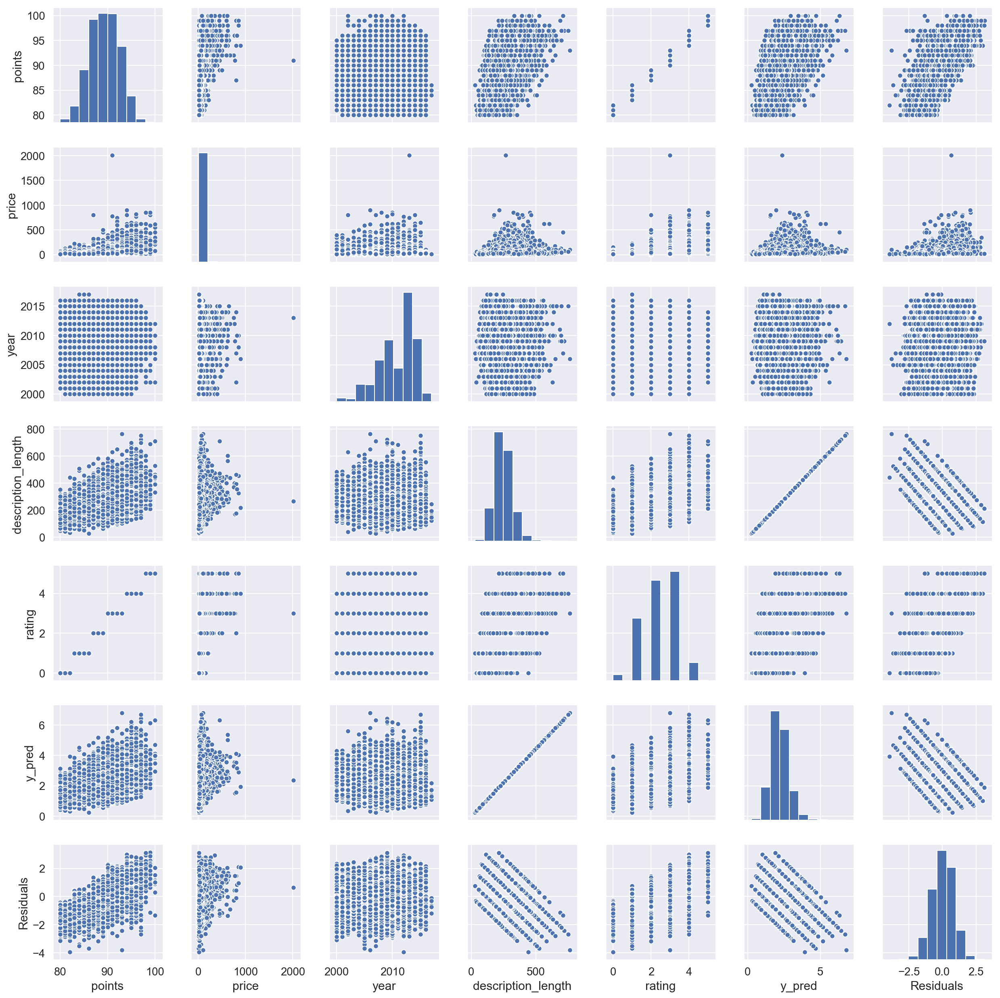

In [129]:
sns.pairplot(X)

### Cross Validation with Lasso Regression

In [83]:
import patsy

from sklearn.linear_model import Ridge, Lasso, ElasticNet, LinearRegression, RidgeCV, LassoCV, ElasticNetCV
from sklearn.model_selection import cross_val_score

In [134]:
data.columns

Index(['country', 'description', 'designation', 'points', 'price', 'province',
       'region_1', 'taster_name', 'title', 'variety', 'winery', 'year',
       'description_length', 'cleaned_description', 'rating', 'y_pred',
       'Residuals'],
      dtype='object')

### Naive Bayes Language NLP
On description of the wine by the reviewer

In [135]:
import pandas as pd, seaborn as sns, numpy as np, matplotlib.pyplot as plt

from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer, TfidfVectorizer 
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import learning_curve
from sklearn.model_selection import train_test_split, cross_val_score, ShuffleSplit
from sklearn.metrics import classification_report
from sklearn.naive_bayes import MultinomialNB, BernoulliNB, GaussianNB
from sklearn.linear_model import LogisticRegression

from sklearn.pipeline import Pipeline

import nltk
import string
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer
from nltk.stem.porter import PorterStemmer
from sklearn.feature_extraction.text import CountVectorizer
from wordcloud import WordCloud, STOPWORDS
import re

%matplotlib inline

sns.set_style("darkgrid")

In [136]:
data['description']= data['description'].str.lower()
data['description']= data['description'].apply(lambda elem: re.sub('[^a-zA-Z]',' ', elem))  
data['description']

0         aromas include tropical fruit  broom  brimston...
3         pineapple rind  lemon pith and orange blossom ...
4         much like the regular bottling from       this...
5         blackberry and raspberry aromas show a typical...
6         here s a bright  informal red that opens with ...
9         this has great depth of flavor with its fresh ...
10        soft  supple plum envelopes an oaky structure ...
13        this is dominated by oak and oak driven aromas...
16        baked plum  molasses  balsamic vinegar and che...
17        raw black cherry aromas are direct and simple ...
18        desiccated blackberry  leather  charred wood a...
20        ripe aromas of dark berries mingle with ample ...
22        delicate aromas recall white flower and citrus...
23        this wine from the geneseo district offers aro...
24        aromas of prune  blackcurrant  toast and oak c...
25        oak and earth intermingle around robust aromas...
26        pretty aromas of yellow flower

In [137]:
tokenizer = RegexpTokenizer(r'\w+')
words_descriptions = data['description'].apply(tokenizer.tokenize)
words_descriptions.head()

0    [aromas, include, tropical, fruit, broom, brim...
3    [pineapple, rind, lemon, pith, and, orange, bl...
4    [much, like, the, regular, bottling, from, thi...
5    [blackberry, and, raspberry, aromas, show, a, ...
6    [here, s, a, bright, informal, red, that, open...
Name: description, dtype: object

In [138]:
all_words = [word for tokens in words_descriptions for word in tokens]
data['description_lengths']= [len(tokens) for tokens in words_descriptions]
VOCAB = sorted(list(set(all_words)))
print("%s words total, with a vocabulary size of %s" % (len(all_words), len(VOCAB)))

2913634 words total, with a vocabulary size of 24634


In [139]:
from collections import Counter
count_all_words = Counter(all_words)
count_all_words.most_common(100)

[('and', 190102),
 ('the', 120999),
 ('a', 96923),
 ('of', 95081),
 ('with', 64715),
 ('this', 61216),
 ('is', 50693),
 ('it', 46872),
 ('wine', 41644),
 ('in', 35397),
 ('flavors', 32804),
 ('to', 29957),
 ('s', 29906),
 ('fruit', 26650),
 ('on', 24289),
 ('aromas', 22243),
 ('that', 21686),
 ('palate', 20644),
 ('finish', 18033),
 ('from', 17948),
 ('acidity', 17537),
 ('cherry', 16719),
 ('but', 16464),
 ('tannins', 16102),
 ('black', 15843),
 ('drink', 15268),
 ('ripe', 14054),
 ('are', 13687),
 ('has', 12314),
 ('red', 11625),
 ('for', 11426),
 ('by', 10760),
 ('oak', 10678),
 ('spice', 10605),
 ('notes', 9801),
 ('as', 9787),
 ('an', 9767),
 ('rich', 9491),
 ('its', 9490),
 ('dry', 9052),
 ('berry', 8926),
 ('now', 8743),
 ('full', 8731),
 ('nose', 8707),
 ('fresh', 8479),
 ('blend', 8323),
 ('plum', 7813),
 ('blackberry', 7408),
 ('offers', 7275),
 ('sweet', 7120),
 ('apple', 7035),
 ('well', 6998),
 ('soft', 6941),
 ('dark', 6883),
 ('white', 6753),
 ('cabernet', 6701),
 ('show

In [140]:
stopword_list = stopwords.words('english')
ps = PorterStemmer()
words_descriptions = words_descriptions.apply(lambda elem: [word for word in elem if not word in stopword_list])
words_descriptions = words_descriptions.apply(lambda elem: [ps.stem(word) for word in elem])
data['description_cleaned'] = words_descriptions.apply(lambda elem: ' '.join(elem))

In [141]:
all_words = [word for tokens in words_descriptions for word in tokens]
VOCAB = sorted(list(set(all_words)))
print("%s words total, with a vocabulary size of %s" % (len(all_words), len(VOCAB)))
count_all_words = Counter(all_words)
count_all_words.most_common(100)

1784385 words total, with a vocabulary size of 17527


[('wine', 43215),
 ('flavor', 37057),
 ('fruit', 33060),
 ('aroma', 22997),
 ('finish', 20807),
 ('palat', 20702),
 ('acid', 20106),
 ('cherri', 19359),
 ('tannin', 17339),
 ('drink', 17021),
 ('black', 15868),
 ('ripe', 15014),
 ('dri', 14826),
 ('note', 13403),
 ('spice', 13171),
 ('rich', 12023),
 ('red', 11756),
 ('oak', 11003),
 ('show', 10682),
 ('fresh', 10590),
 ('berri', 10218),
 ('blend', 9403),
 ('offer', 9277),
 ('full', 8804),
 ('blackberri', 8800),
 ('nose', 8714),
 ('plum', 8481),
 ('sweet', 8432),
 ('textur', 8392),
 ('appl', 7933),
 ('bodi', 7844),
 ('balanc', 7816),
 ('age', 7435),
 ('soft', 7314),
 ('well', 7008),
 ('crisp', 6949),
 ('dark', 6930),
 ('white', 6829),
 ('cabernet', 6813),
 ('raspberri', 6756),
 ('structur', 6602),
 ('vanilla', 6520),
 ('light', 6435),
 ('herb', 6298),
 ('miner', 6207),
 ('bright', 5978),
 ('year', 5925),
 ('hint', 5765),
 ('vineyard', 5735),
 ('pepper', 5693),
 ('give', 5688),
 ('citru', 5659),
 ('touch', 5437),
 ('fruiti', 5401),
 ('c

In [142]:
# tokenizer = RegexpTokenizer(r'\w+')
# data['all_words'] = data['description_cleaned'].apply(tokenizer.tokenize)
data.head()

,country,description,designation,points,price,province,region_1,taster_name,title,variety,winery,year,description_length,cleaned_description,rating,y_pred,Residuals,description_lengths,description_cleaned
0,Italy,aromas include tropical fruit broom brimston...,Vulkà Bianco,87,20.0,Sicily & Sardinia,Etna,Kerin O’Keefe,Nicosia 2013 Vulkà Bianco (Etna),White Blend,Nicosia,2013.0,172,aromas include tropical fruit broom brimstone ...,2,1.529113,0.470887,25,aroma includ tropic fruit broom brimston dri h...
3,US,pineapple rind lemon pith and orange blossom ...,Reserve Late Harvest,87,13.0,Michigan,Lake Michigan Shore,Alexander Peartree,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian,2013.0,199,pineapple rind lemon pith orange blossom start...,2,1.769148,0.230852,34,pineappl rind lemon pith orang blossom start a...
4,US,much like the regular bottling from this...,Vintner's Reserve Wild Child Block,87,65.0,Oregon,Willamette Valley,Paul Gregutt,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks,2012.0,249,much like regular bottling comes across rather...,2,2.213658,-0.213658,41,much like regular bottl come across rather rou...
5,Spain,blackberry and raspberry aromas show a typical...,Ars In Vitro,87,15.0,Northern Spain,Navarra,Michael Schachner,Tandem 2011 Ars In Vitro Tempranillo-Merlot (N...,Tempranillo-Merlot,Tandem,2011.0,261,blackberry raspberry aromas show typical navar...,2,2.320340,-0.320340,42,blackberri raspberri aroma show typic navarran...
6,Italy,here s a bright informal red that opens with ...,Belsito,87,16.0,Sicily & Sardinia,Vittoria,Kerin O’Keefe,Terre di Giurfo 2013 Belsito Frappato (Vittoria),Frappato,Terre di Giurfo,2013.0,181,bright informal red opens aromas candied berry...,2,1.609125,0.390875,33,bright inform red open aroma candi berri white...


In [143]:
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer
from sklearn.model_selection import train_test_split
from catboost import Pool, CatBoostRegressor, cv

def prepare_dataframe(vect, data, features=True):
    vectorized=vect.fit_transform(data['description_cleaned']).toarray()
    vectorized=pd.DataFrame(vectorized)
    if features == True:
        X=data.drop(columns=['points','description','description_cleaned'])
        X=X.fillna(-1)
        print(X.columns)
        X=pd.concat([X.reset_index(drop=True),vectorized.reset_index(drop=True)],axis=1)
        categorical_features_indices =[0,1,3,4,5,6,7,8,9,10]
    else:
        X=vectorized
        categorical_features_indices =[]
    y=data['points']
    return X,y,categorical_features_indices

In [144]:
#model definintion and training.
def perform_model(X_train, y_train,X_valid, y_valid,X_test, y_test,categorical_features_indices,name):
    model = CatBoostRegressor(
        random_seed = 100,
        loss_function = 'RMSE',
        iterations=800,
    )
    
    model.fit(
        X_train, y_train,
        cat_features = categorical_features_indices,
        verbose=False,
        eval_set=(X_valid, y_valid)
    )
    
    print(name+" technique RMSE on training data: "+ model.score(X_train, y_train).astype(str))
    print(name+" technique RMSE on test data: "+ model.score(X_test, y_test).astype(str))
    

In [145]:
def prepare_variable(vect, data, features_append=True):
    X, y , categorical_features_indices = prepare_dataframe(vect, data,features_append)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.05, 
                                                        random_state=42)
    X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, 
                                                        random_state=52)
    return X_train, y_train,X_valid, y_valid,X_test, y_test, categorical_features_indices

#### Bag of Words Counts - embeds each sentences as a list of 0 or 1, 1 represent containing word.

In [146]:
vect= CountVectorizer(analyzer='word', token_pattern=r'\w+',max_features=500)
training_variable=prepare_variable(vect, data)
perform_model(*training_variable, 'Bag of Words Counts')

Index(['country', 'designation', 'price', 'province', 'region_1',
       'taster_name', 'title', 'variety', 'winery', 'year',
       'description_length', 'cleaned_description', 'rating', 'y_pred',
       'Residuals', 'description_lengths'],
      dtype='object')


CatboostError: Bad value for num_feature[0,11]="distinguished pinot noir shows coastal origins brisk tannins citrusy acidity beneath astringency tartness impressive cherry currant cola sweet tobacco sandalwood flavors finish great complexity style certainly seems like wine cellar window drinkability": Cannot convert 'b'distinguished pinot noir shows coastal origins brisk tannins citrusy acidity beneath astringency tartness impressive cherry currant cola sweet tobacco sandalwood flavors finish great complexity style certainly seems like wine cellar window drinkability'' to float

In [148]:
vect= CountVectorizer(analyzer='word', token_pattern=r'\w+',max_features=500)
training_variable=prepare_variable(vect, data, False)
perform_model(*training_variable, 'Bag of Words Counts')

Bag of Words Counts technique RMSE on training data: 2.066593468802016
Bag of Words Counts technique RMSE on test data: 2.0930036769758362


#### TF-IDF (Term Frequency, Inverse Document Frequency) - weighing words by how frequent they are in our dataset, discounting words that are too frequent.

In [149]:
vect= TfidfVectorizer(analyzer='word', token_pattern=r'\w+',max_features=500)
training_variable=prepare_variable(vect, data)
perform_model(*training_variable, 'TF-IDF')

Index(['country', 'designation', 'price', 'province', 'region_1',
       'taster_name', 'title', 'variety', 'winery', 'year',
       'description_length', 'cleaned_description', 'rating', 'y_pred',
       'Residuals', 'description_lengths'],
      dtype='object')


CatboostError: Bad value for num_feature[0,11]="distinguished pinot noir shows coastal origins brisk tannins citrusy acidity beneath astringency tartness impressive cherry currant cola sweet tobacco sandalwood flavors finish great complexity style certainly seems like wine cellar window drinkability": Cannot convert 'b'distinguished pinot noir shows coastal origins brisk tannins citrusy acidity beneath astringency tartness impressive cherry currant cola sweet tobacco sandalwood flavors finish great complexity style certainly seems like wine cellar window drinkability'' to float

In [150]:
vect= TfidfVectorizer(analyzer='word', token_pattern=r'\w+',max_features=500)
training_variable=prepare_variable(vect, data, False)
perform_model(*training_variable, 'TF-IDF')

TF-IDF technique RMSE on training data: 2.0250852107126085
TF-IDF technique RMSE on test data: 2.0593500376942937


In [151]:
tokenizer = RegexpTokenizer(r'\w+')
data['all_words'] = data['description_cleaned'].apply(tokenizer.tokenize)
data.head()

,country,description,designation,points,price,province,region_1,taster_name,title,variety,winery,year,description_length,cleaned_description,rating,y_pred,Residuals,description_lengths,description_cleaned,all_words
0,Italy,aromas include tropical fruit broom brimston...,Vulkà Bianco,87,20.0,Sicily & Sardinia,Etna,Kerin O’Keefe,Nicosia 2013 Vulkà Bianco (Etna),White Blend,Nicosia,2013.0,172,aromas include tropical fruit broom brimstone ...,2,1.529113,0.470887,25,aroma includ tropic fruit broom brimston dri h...,"[aroma, includ, tropic, fruit, broom, brimston..."
3,US,pineapple rind lemon pith and orange blossom ...,Reserve Late Harvest,87,13.0,Michigan,Lake Michigan Shore,Alexander Peartree,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian,2013.0,199,pineapple rind lemon pith orange blossom start...,2,1.769148,0.230852,34,pineappl rind lemon pith orang blossom start a...,"[pineappl, rind, lemon, pith, orang, blossom, ..."
4,US,much like the regular bottling from this...,Vintner's Reserve Wild Child Block,87,65.0,Oregon,Willamette Valley,Paul Gregutt,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks,2012.0,249,much like regular bottling comes across rather...,2,2.213658,-0.213658,41,much like regular bottl come across rather rou...,"[much, like, regular, bottl, come, across, rat..."
5,Spain,blackberry and raspberry aromas show a typical...,Ars In Vitro,87,15.0,Northern Spain,Navarra,Michael Schachner,Tandem 2011 Ars In Vitro Tempranillo-Merlot (N...,Tempranillo-Merlot,Tandem,2011.0,261,blackberry raspberry aromas show typical navar...,2,2.320340,-0.320340,42,blackberri raspberri aroma show typic navarran...,"[blackberri, raspberri, aroma, show, typic, na..."
6,Italy,here s a bright informal red that opens with ...,Belsito,87,16.0,Sicily & Sardinia,Vittoria,Kerin O’Keefe,Terre di Giurfo 2013 Belsito Frappato (Vittoria),Frappato,Terre di Giurfo,2013.0,181,bright informal red opens aromas candied berry...,2,1.609125,0.390875,33,bright inform red open aroma candi berri white...,"[bright, inform, red, open, aroma, candi, berr..."


In [152]:
# Checkpoint to save data
import pickle
with open("data.pkl", "wb") as f:
    pickle.dump(data, f)

In [153]:
# Checkpoint to load df
import pickle
with open('data.pkl', "rb") as f:
    data = pickle.load(f)

In [154]:
data.head()

,country,description,designation,points,price,province,region_1,taster_name,title,variety,winery,year,description_length,cleaned_description,rating,y_pred,Residuals,description_lengths,description_cleaned,all_words
0,Italy,aromas include tropical fruit broom brimston...,Vulkà Bianco,87,20.0,Sicily & Sardinia,Etna,Kerin O’Keefe,Nicosia 2013 Vulkà Bianco (Etna),White Blend,Nicosia,2013.0,172,aromas include tropical fruit broom brimstone ...,2,1.529113,0.470887,25,aroma includ tropic fruit broom brimston dri h...,"[aroma, includ, tropic, fruit, broom, brimston..."
3,US,pineapple rind lemon pith and orange blossom ...,Reserve Late Harvest,87,13.0,Michigan,Lake Michigan Shore,Alexander Peartree,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian,2013.0,199,pineapple rind lemon pith orange blossom start...,2,1.769148,0.230852,34,pineappl rind lemon pith orang blossom start a...,"[pineappl, rind, lemon, pith, orang, blossom, ..."
4,US,much like the regular bottling from this...,Vintner's Reserve Wild Child Block,87,65.0,Oregon,Willamette Valley,Paul Gregutt,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks,2012.0,249,much like regular bottling comes across rather...,2,2.213658,-0.213658,41,much like regular bottl come across rather rou...,"[much, like, regular, bottl, come, across, rat..."
5,Spain,blackberry and raspberry aromas show a typical...,Ars In Vitro,87,15.0,Northern Spain,Navarra,Michael Schachner,Tandem 2011 Ars In Vitro Tempranillo-Merlot (N...,Tempranillo-Merlot,Tandem,2011.0,261,blackberry raspberry aromas show typical navar...,2,2.320340,-0.320340,42,blackberri raspberri aroma show typic navarran...,"[blackberri, raspberri, aroma, show, typic, na..."
6,Italy,here s a bright informal red that opens with ...,Belsito,87,16.0,Sicily & Sardinia,Vittoria,Kerin O’Keefe,Terre di Giurfo 2013 Belsito Frappato (Vittoria),Frappato,Terre di Giurfo,2013.0,181,bright informal red opens aromas candied berry...,2,1.609125,0.390875,33,bright inform red open aroma candi berri white...,"[bright, inform, red, open, aroma, candi, berr..."


In [155]:
# # Let's use the CountVectorizer to count words for us
# cvt      =  CountVectorizer(strip_accents='unicode',min_df=51)
# X_all    =  cvt.fit_transform(data['description'])
# columns  =  np.array(cvt.get_feature_names())          # ndarray (for indexing below)

# # note this is a large sparse matrix. 
# #    - rows are tweets, columns are words 
# X_all

In [156]:
# Let's use the CountVectorizer to count words for us
cvt      =  CountVectorizer(strip_accents='unicode',min_df=51)
X_all    =  cvt.fit_transform(data['description_cleaned'])
columns  =  np.array(cvt.get_feature_names())          # ndarray (for indexing below)

# note this is a large sparse matrix. 
#    - rows are tweets, columns are words 
X_all

<69331x2286 sparse matrix of type '<class 'numpy.int64'>'
	with 1633904 stored elements in Compressed Sparse Row format>

In [157]:
# # Converting X_all toarray() may use too much memory (particularly for 32-bit Python!)
# print(X_all.shape)
# print("Requires {} ints to do a .toarray()!".format(X_all.shape[0] * X_all.shape[1]))

# # x_df     =  pd.DataFrame(X_all.toarray(), columns=columns)
# # tf_df    =  pd.DataFrame(x_df.sum(), columns=["freq"])
# # tf_df.sort_values("freq", ascending=False).head(10)

In [158]:
# Converting X_all toarray() may use too much memory (particularly for 32-bit Python!)
print(X_all.shape)
print("Requires {} ints to do a .toarray()!".format(X_all.shape[0] * X_all.shape[1]))

# x_df     =  pd.DataFrame(X_all.toarray(), columns=columns)
# tf_df    =  pd.DataFrame(x_df.sum(), columns=["freq"])
# tf_df.sort_values("freq", ascending=False).head(10)

(69331, 2286)
Requires 158490666 ints to do a .toarray()!


In [159]:
def get_freq_words(sparse_counts, columns):
    # X_all is a sparse matrix, so sum() returns a 'matrix' datatype ...
    #   which we then convert into a 1-D ndarray for sorting
    word_counts = np.asarray(X_all.sum(axis=0)).reshape(-1)

    # argsort() returns smallest first, so we reverse the result
    largest_count_indices = word_counts.argsort()[::-1]

    # pretty-print the results! Remember to always ask whether they make sense ...
    freq_words = pd.Series(word_counts[largest_count_indices], 
                           index=columns[largest_count_indices])

    return freq_words


freq_words = get_freq_words(X_all, columns)
freq_words[:20]

wine      43215
flavor    37057
fruit     33060
aroma     22997
finish    20807
palat     20702
acid      20106
cherri    19359
tannin    17339
drink     17021
black     15868
ripe      15014
dri       14826
note      13403
spice     13171
rich      12023
red       11756
oak       11003
show      10682
fresh     10590
dtype: int64

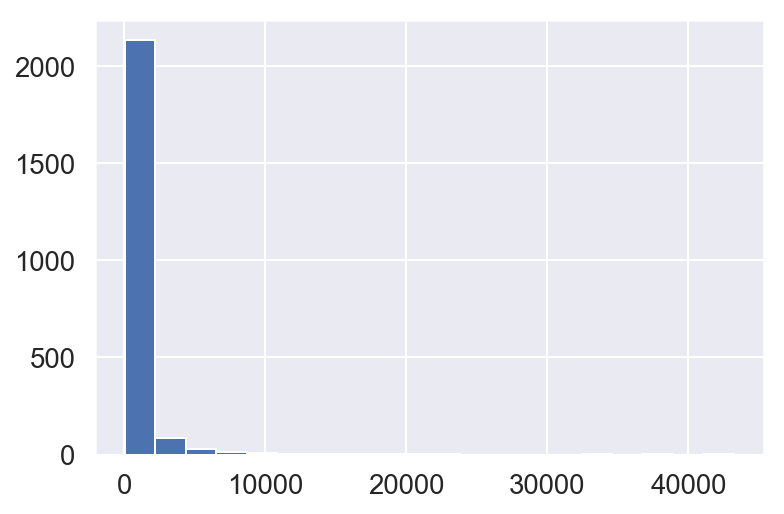

In [160]:
freq_words.hist(bins=20)

wine      43215
flavor    37057
fruit     33060
aroma     22997
finish    20807
palat     20702
acid      20106
cherri    19359
tannin    17339
drink     17021
dtype: int64


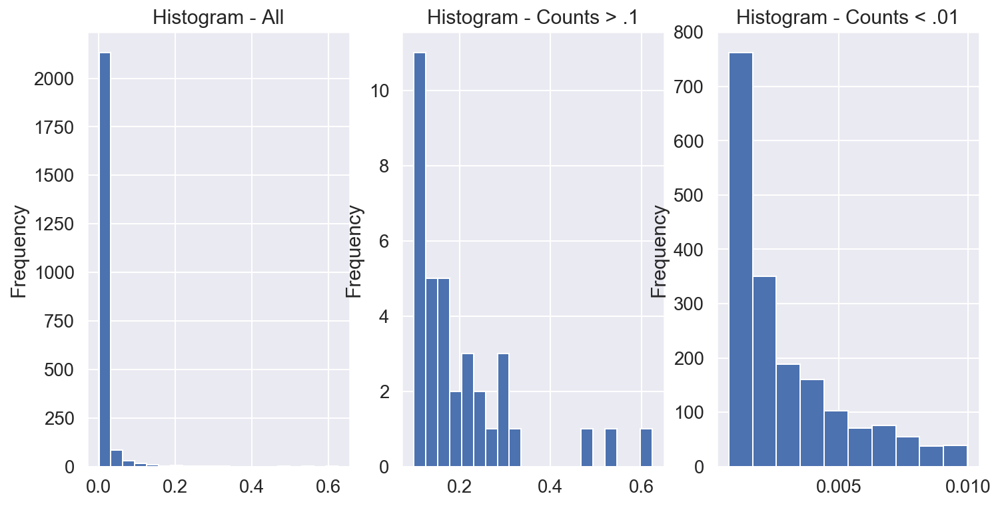

In [161]:
from sklearn.preprocessing import StandardScaler, minmax_scale

def hist_counts(word_counts):
    hist_counts = pd.Series(word_counts/len(data), 
                            index=word_counts.index)
    
    # Overall graph is hard to understand, so let's break it into three graphs
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12,6))
    
    hist_counts.plot(kind="hist", bins=20, ax=axes[0], title="Histogram - All")
    
    # look at the range of extreme commons that seem to exist below .01
    hist_counts[hist_counts < .01].plot(kind="hist", ax=axes[2], title="Histogram - Counts < .01")
    
    # There are a lot of really common tokens within 10% -- filter them out
    hist_counts[hist_counts > .1].plot(kind="hist", bins=20, ax=axes[1], title="Histogram - Counts > .1")

print(freq_words[:10])
hist_counts(freq_words)

#### Stopwords Removal and try again - to erase

wine       41644
flavors    32804
fruit      26650
aromas     22243
palate     20644
finish     18033
acidity    17537
cherry     16719
tannins    16102
black      15843
dtype: int64


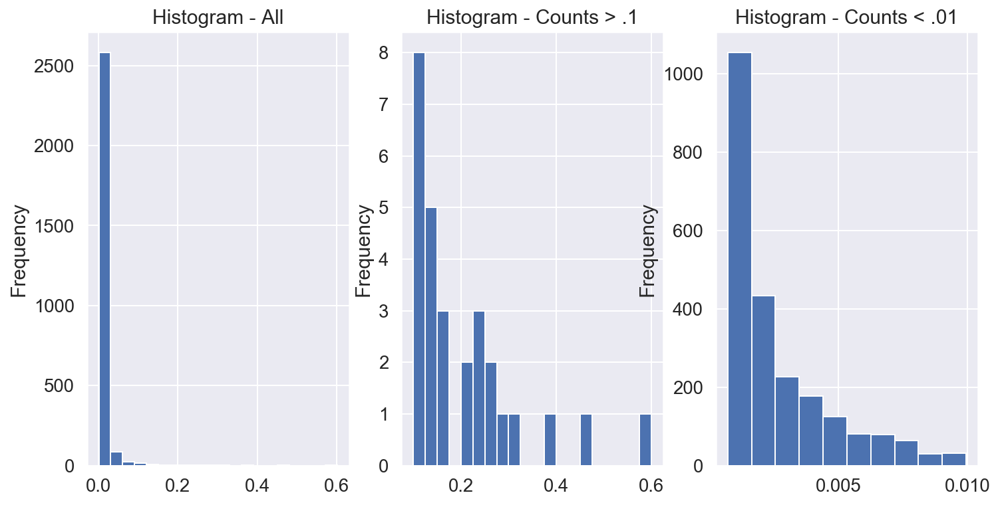

In [162]:
cvt      =  CountVectorizer(strip_accents='unicode', stop_words="english", min_df=51)
X_all    =  cvt.fit_transform(data['description'])
columns  =  np.array(cvt.get_feature_names())

freq_words = get_freq_words(X_all, columns)

print(freq_words[:10])
hist_counts(freq_words)

In [163]:
freq_words.head(20)

wine       41644
flavors    32804
fruit      26650
aromas     22243
palate     20644
finish     18033
acidity    17537
cherry     16719
tannins    16102
black      15843
drink      15268
ripe       14054
red        11625
oak        10678
spice      10605
notes       9801
rich        9491
dry         9052
berry       8926
nose        8707
dtype: int64

In [164]:
freq_words.shape

(2723,)

In [168]:
# Checking range between .99 - .99999 -- there seem to be lots of words there
freq_words.quantile(.99), freq_words.quantile(.99999)

(6928.2400000000125, 41403.375200000504)

In [166]:
freq_words[(freq_words >= 10) & (freq_words <= 150)]

oldest           150
petrol           150
layering         150
eventually       150
compost          150
cooler           150
packs            150
toastiness       150
streamlined      150
proving          150
class            150
incense          149
blocky           149
stemmy           149
screwcap         149
majority         149
garrigue         149
stiff            149
peak             149
hours            148
settle           148
tuscany          148
twist            148
slender          148
crowd            148
fish             148
lick             148
certain          147
pizza            147
outstanding      147
                ... 
sharply           52
judicious         52
vibrantly         52
stretch           52
characterizes     52
looks             52
today             52
wildflower        52
detect            52
gravenstein       52
smoothed          52
dainty            52
goodness          52
chance            51
marries           51
zins              51
inflected    

In [167]:
cvt_ng = CountVectorizer(stop_words="english", ngram_range=(2,4))
X_all_ng = cvt_ng.fit_transform(data['description'])
columns_ng  =  np.array(cvt_ng.get_feature_names())

freq_words_ng = get_freq_words(X_all_ng, columns_ng)
print(freq_words_ng.shape)
freq_words_ng.head()

(2723,)


acacia carry linear             41644
abouriou malbec juicy berry     32804
abrasive hard edged tannins     26650
abbey ruins                     22243
absolutely lovely pinot noir    20644
dtype: int64

In [169]:
cvt_ng = CountVectorizer(stop_words="english", ngram_range=(2,4))
X_all_ng = cvt_ng.fit_transform(data['description_cleaned'])
columns_ng  =  np.array(cvt_ng.get_feature_names())

freq_words_ng = get_freq_words(X_all_ng, columns_ng)
print(freq_words_ng.shape)
freq_words_ng.head()

(2723,)


acacia flower golden           41644
abras cherri plum              32804
abras mouthfeel pinch salti    26650
abbey ruin                     22243
absolut reason age grace       20644
dtype: int64

In [170]:
print(freq_words_ng)

acacia flower golden                41644
abras cherri plum                   32804
abras mouthfeel pinch salti         26650
abbey ruin                          22243
absolut reason age grace            20644
abouri juici flavor soft            18033
aaron pott remark blend             17537
abl hit high note                   16719
abv bruiser bodi                    16102
abil age green plum                 15843
abound look unoak                   15268
abund earthi mint                   14054
abund cherri note                   11625
absolut load tropic fruit           10678
abund scour protrud acid            10605
absolut keeper visit                 9801
abund dri                            9491
abound make downright irresist       9052
abil age cabernet                    8926
absolut juici                        8707
abras lightli herbal                 8479
abil approach timeless               8323
absorb hefti alcohol bit             7813
abil age long                     

In [171]:
from nltk.corpus import stopwords
stop = stopwords.words('english')
# # stop += ['http', 'https', 'rt']

In [172]:
# data_train["description"] = [str (item) for item in data_train["description"]]

In [173]:
# data_train["description"] = data_train["description"].str.lower()
# data_train["description"] = [item for item in data_train["description"] if not isinstance(item, int)]

In [174]:
# Find our training size
training_size = int(data.shape[0] * .7)

# Randomly sample our training data
data_train = data.sample(n=training_size, replace=True)

# Capture the rest of the dataset that's not "training" using an inverse mask (rows NOT IN training dataframe)
mask = data.index.isin(data_train.index)
data_test = data[~mask]

# Should be (2762, 1963) = training / testing = 70/30
data_train.shape[0], data_test.shape[0]

(48531, 34405)

In [175]:
data_train.dtypes

country                 object
description             object
designation             object
points                   int32
price                  float32
province                object
region_1                object
taster_name             object
title                   object
variety                 object
winery                  object
year                   float64
description_length       int64
cleaned_description     object
rating                   int64
y_pred                 float64
Residuals              float64
description_lengths      int64
description_cleaned     object
all_words               object
dtype: object

### Using cvt only

In [176]:
# MultinomialNB
pipeline = Pipeline([
    ('vect', CountVectorizer(lowercase=True, strip_accents='unicode', stop_words=stop)),
    ('tfidf', TfidfTransformer()),
    ('cls', MultinomialNB())
]) 
pipeline.fit(data_train["description"], data_train["points"])
predicted = pipeline.predict(data_test["description"])
pipeline.score(data_test["description"], data_test["points"])

0.17837523615753526

In [177]:
# MultinomialNB
pipeline = Pipeline([
    ('vect', CountVectorizer(lowercase=True, strip_accents='unicode', stop_words=stop)),
    ('tfidf', TfidfTransformer()),
    ('cls', MultinomialNB())
]) 
pipeline.fit(data_train["description_cleaned"], data_train["points"])
predicted = pipeline.predict(data_test["description_cleaned"])
pipeline.score(data_test["description_cleaned"], data_test["points"])

0.17959598895509374

In [178]:
pipeline = Pipeline([
    ('vect', cvt),
    # ('tfidf', TfidfTransformer()),
    ('cls', MultinomialNB())
]) 
pipeline.fit(data_train["description"], data_train["points"])
predicted = pipeline.predict(data_test["description"])
pipeline.score(data_test["description"], data_test["points"])

0.1871239645400378

In [179]:
pipeline = Pipeline([
    ('vect', cvt),
    # ('tfidf', TfidfTransformer()),
    ('cls', MultinomialNB())
]) 
pipeline.fit(data_train["description_cleaned"], data_train["points"])
predicted = pipeline.predict(data_test["description_cleaned"])
pipeline.score(data_test["description_cleaned"], data_test["points"])

0.18851911059439036

In [180]:
# BernoulliNB
pipeline = Pipeline([
    ('vect', cvt),
    ('tfidf', TfidfTransformer()), #by adding this we get +2%
    ('cls', BernoulliNB())
]) 
pipeline.fit(data_train["description"], data_train["points"])
predicted = pipeline.predict(data_test["description"])
pipeline.score(data_test["description"], data_test["points"])

0.1960470861793344

In [181]:
# BernoulliNB
pipeline = Pipeline([
    ('vect', cvt),
    ('tfidf', TfidfTransformer()), #by adding this we get +2%
    ('cls', BernoulliNB())
]) 
pipeline.fit(data_train["description_cleaned"], data_train["points"])
predicted = pipeline.predict(data_test["description_cleaned"])
pipeline.score(data_test["description_cleaned"], data_test["points"])

0.19642493823572155

In [182]:
# LogisticRegression
pipeline = Pipeline([
    ('vect', cvt),
    ('tfidf', TfidfTransformer()),
    ('cls', LogisticRegression())
]) 
pipeline.fit(data_train["description"], data_train["points"])
predicted = pipeline.predict(data_test["description"])
pipeline.score(data_test["description"], data_test["points"])

0.1968027902921087

In [183]:
# LogisticRegression
pipeline = Pipeline([
    ('vect', cvt),
    ('tfidf', TfidfTransformer()),
    ('cls', LogisticRegression())
]) 
pipeline.fit(data_train["description_cleaned"], data_train["points"])
predicted = pipeline.predict(data_test["description_cleaned"])
pipeline.score(data_test["description_cleaned"], data_test["points"])

0.19982560674320593

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# RF - 100
pipeline = Pipeline([
    ('vect', cvt),
    ('tfidf', TfidfTransformer()),
    ('rf', RandomForestClassifier(n_estimators=100))
]) 
pipeline.fit(data_train["description"], data_train["points"])
predicted = pipeline.predict(data_test["description"])
pipeline.score(data_test["description"], data_test["points"])

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# RF - 100
pipeline = Pipeline([
    ('vect', cvt),
    ('tfidf', TfidfTransformer()),
    ('rf', RandomForestClassifier(n_estimators=100))
]) 
pipeline.fit(data_train["description_cleaned"], data_train["points"])
predicted = pipeline.predict(data_test["description_cleaned"])
pipeline.score(data_test["description_cleaned"], data_test["points"])

In [ ]:
# RF - 200
pipeline = Pipeline([
    ('vect', cvt),
    ('tfidf', TfidfTransformer()),
    ('rf', RandomForestClassifier(n_estimators=200))
]) 
pipeline.fit(data_train["description_cleaned"], data_train["points"])
predicted = pipeline.predict(data_test["description_cleaned"])
pipeline.score(data_test["description_cleaned"], data_test["points"])

### Useing cvt_ng instead of cvt

In [128]:
# MultinomialNB
pipeline = Pipeline([
    ('vect', cvt_ng),
    # ('tfidf', TfidfTransformer()),
    ('cls', MultinomialNB())
]) 
pipeline.fit(data_train["description"], data_train["points"])
predicted = pipeline.predict(data_test["description"])
pipeline.score(data_test["description"], data_test["points"])

0.16913860291979294

In [129]:
# MultinomialNB
pipeline = Pipeline([
    ('vect', cvt_ng),
    # ('tfidf', TfidfTransformer()),
    ('cls', MultinomialNB())
]) 
pipeline.fit(data_train["description_cleaned"], data_train["points"])
predicted = pipeline.predict(data_test["description_cleaned"])
pipeline.score(data_test["description_cleaned"], data_test["points"])

0.16803350200663061

In [130]:
# BernoulliNB
pipeline = Pipeline([
    ('vect', cvt_ng),
    ('tfidf', TfidfTransformer()), 
    ('cls', BernoulliNB())
]) 
pipeline.fit(data_train["description"], data_train["points"])
predicted = pipeline.predict(data_test["description"])
pipeline.score(data_test["description"], data_test["points"])

0.13490955621473855

In [131]:
# BernoulliNB
pipeline = Pipeline([
    ('vect', cvt_ng),
    ('tfidf', TfidfTransformer()), 
    ('cls', BernoulliNB())
]) 
pipeline.fit(data_train["description_cleaned"], data_train["points"])
predicted = pipeline.predict(data_test["description_cleaned"])
pipeline.score(data_test["description_cleaned"], data_test["points"])

0.13784679811551212

In [132]:
# LogisticRegression
pipeline = Pipeline([
    ('vect', cvt_ng),
    ('tfidf', TfidfTransformer()),
    ('cls', LogisticRegression())
]) 
pipeline.fit(data_train["description"], data_train["points"])
predicted = pipeline.predict(data_test["description"])
pipeline.score(data_test["description"], data_test["points"])

0.15989065317280288

In [133]:
# LogisticRegression
pipeline = Pipeline([
    ('vect', cvt_ng),
    ('tfidf', TfidfTransformer()),
    ('cls', LogisticRegression())
]) 
pipeline.fit(data_train["description_cleaned"], data_train["points"])
predicted = pipeline.predict(data_test["description_cleaned"])
pipeline.score(data_test["description_cleaned"], data_test["points"])

0.16308962950037806

In [ ]:
# RF - 100
pipeline = Pipeline([
    ('vect', cvt_ng),
    ('tfidf', TfidfTransformer()),
    ('rf', RandomForestClassifier(n_estimators=100))
]) 
pipeline.fit(data_train["description"], data_train["points"])
predicted = pipeline.predict(data_test["description"])
pipeline.score(data_test["description"], data_test["points"])

In [ ]:
# RF - 200
pipeline = Pipeline([
    ('vect', cvt_ng),
    ('tfidf', TfidfTransformer()),
    ('rf', RandomForestClassifier(n_estimators=200))
]) 
pipeline.fit(data_train["description"], data_train["points"])
predicted = pipeline.predict(data_test["description"])
pipeline.score(data_test["description"], data_test["points"])

In [134]:
cvt2 = CountVectorizer(stop_words=stop, lowercase=True, strip_accents="unicode", ngram_range=(1,2))
pipeline = Pipeline([
    ('vect', cvt2),
    # ('tfidf', TfidfTransformer()),
    ('cls', LogisticRegression())
]) 
pipeline.fit(data_train["description"], data_train["points"])
predicted = pipeline.predict(data_test["description"])
pipeline.score(data_test["description"], data_test["points"])

0.1980166346769034

In [135]:
cvt2 = CountVectorizer(stop_words=stop, lowercase=True, strip_accents="unicode", ngram_range=(1,2))
pipeline = Pipeline([
    ('vect', cvt2),
    # ('tfidf', TfidfTransformer()),
    ('cls', LogisticRegression())
]) 
pipeline.fit(data_train["description_cleaned"], data_train["points"])
predicted = pipeline.predict(data_test["description_cleaned"])
pipeline.score(data_test["description_cleaned"], data_test["points"])

0.1973477578084104

In [136]:
pipeline = Pipeline([
    ('vect', cvt2),
    #('tfidf', TfidfTransformer()),
    ('rf', RandomForestClassifier(n_estimators=100))
]) 
pipeline.fit(data_train["description_cleaned"], data_train["points"])
predicted = pipeline.predict(data_test["description"])
pipeline.score(data_test["description_cleaned"], data_test["points"])

0.1821089978479614

In [137]:
pipeline = Pipeline([
    ('vect', cvt),
    # ('tfidf', TfidfTransformer()),
    ('cls', MultinomialNB())
]) 
pipeline.fit(data_train["description_cleaned"], data_train["points"])
predicted = pipeline.predict(data_test["description_cleaned"])
pipeline.score(data_test["description_cleaned"], data_test["points"])

0.19150235560984122

In [138]:
data_test.shape, len(predicted)

((34386, 16), 34386)

In [139]:
predicted = pipeline.predict(data_test["description_cleaned"]) #tweets_test["TEXT"]
print(classification_report(data_test["points"], predicted)) #tweets_test["LANG"]

              precision    recall  f1-score   support

          80       0.11      0.04      0.06       100
          81       0.08      0.04      0.05       162
          82       0.14      0.23      0.17       417
          83       0.16      0.23      0.19       679
          84       0.19      0.21      0.20      1467
          85       0.19      0.18      0.19      2187
          86       0.20      0.16      0.18      3049
          87       0.24      0.27      0.25      4059
          88       0.19      0.15      0.17      4274
          89       0.19      0.18      0.19      3207
          90       0.19      0.18      0.18      4000
          91       0.19      0.20      0.19      3415
          92       0.18      0.19      0.19      3046
          93       0.19      0.23      0.21      2180
          94       0.20      0.18      0.19      1344
          95       0.13      0.14      0.13       504
          96       0.09      0.05      0.07       187
          97       0.06    

In [140]:
def multi_roc(y, probs):
    
    mean_tpr = 0.0
    mean_fpr = np.linspace(0, 1, 100)
    all_tpr = []

    for i, (train, test) in enumerate(cv):
        # probas_ = classifier.fit(X[train], y[train]).predict_proba(X[test])
        # Compute ROC curve and area the curve
        fpr, tpr, thresholds = roc_curve(y[test], probas_[:, 1])
        mean_tpr += interp(mean_fpr, fpr, tpr)
        mean_tpr[0] = 0.0
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, lw=1, label='ROC fold %d (area = %0.2f)' % (i, roc_auc))

    plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6), label='Luck')

    mean_tpr /= len(cv)
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    plt.plot(mean_fpr, mean_tpr, 'k--',
             label='Mean ROC (area = %0.2f)' % mean_auc, lw=2)

    plt.xlim([-0.05, 1.05])
    plt.ylim([-0.05, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

In [141]:
from sklearn.metrics import roc_curve

def plot_roc(y, probs, threshmarkers=None):
    fpr, tpr, thresh = roc_curve(y, probs)

    plt.figure(figsize=(8,8))
    plt.plot(fpr, tpr, lw=2)
   
    plt.xlabel("False Positive Rate\n(1 - Specificity)")
    plt.ylabel("True Positive Rate\n(Sensitivity)")
    plt.xlim([-0.025, 1.025])
    plt.ylim([-0.025, 1.025])
    plt.xticks(np.linspace(0, 1, 21), rotation=45)
    plt.yticks(np.linspace(0, 1, 21))
    plt.show()

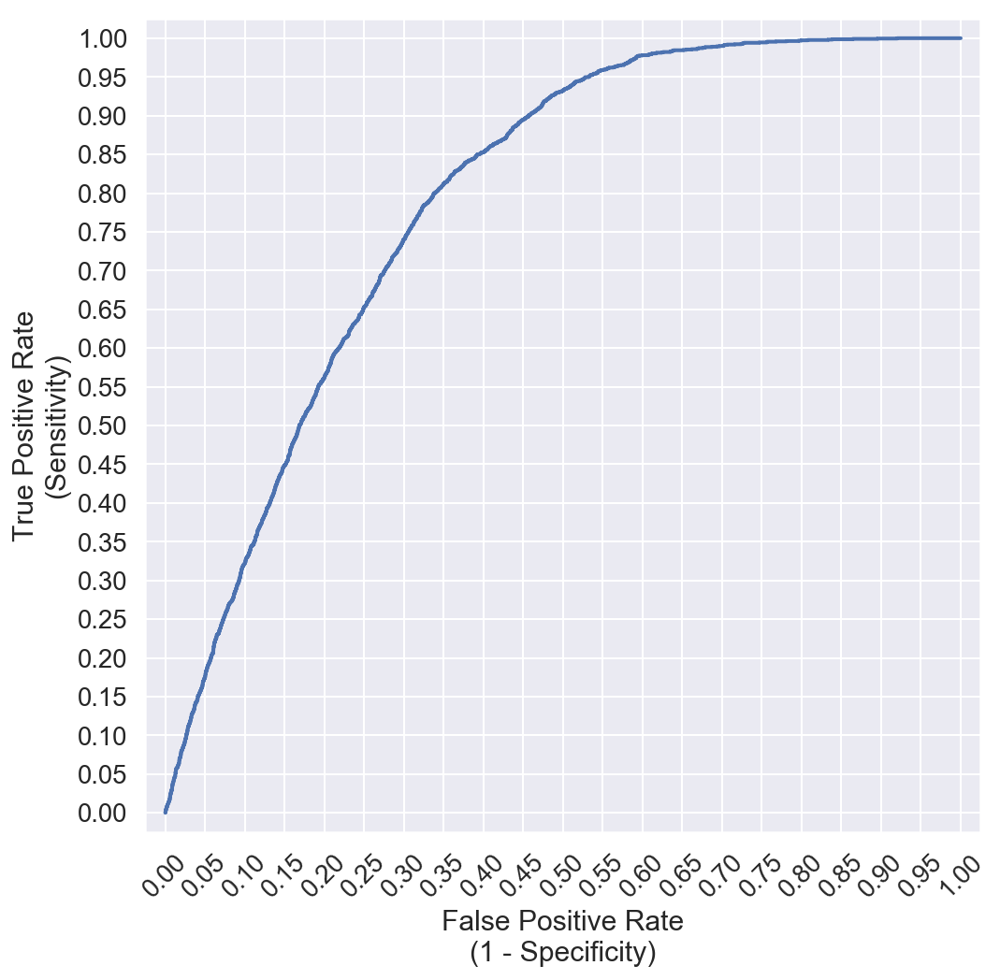

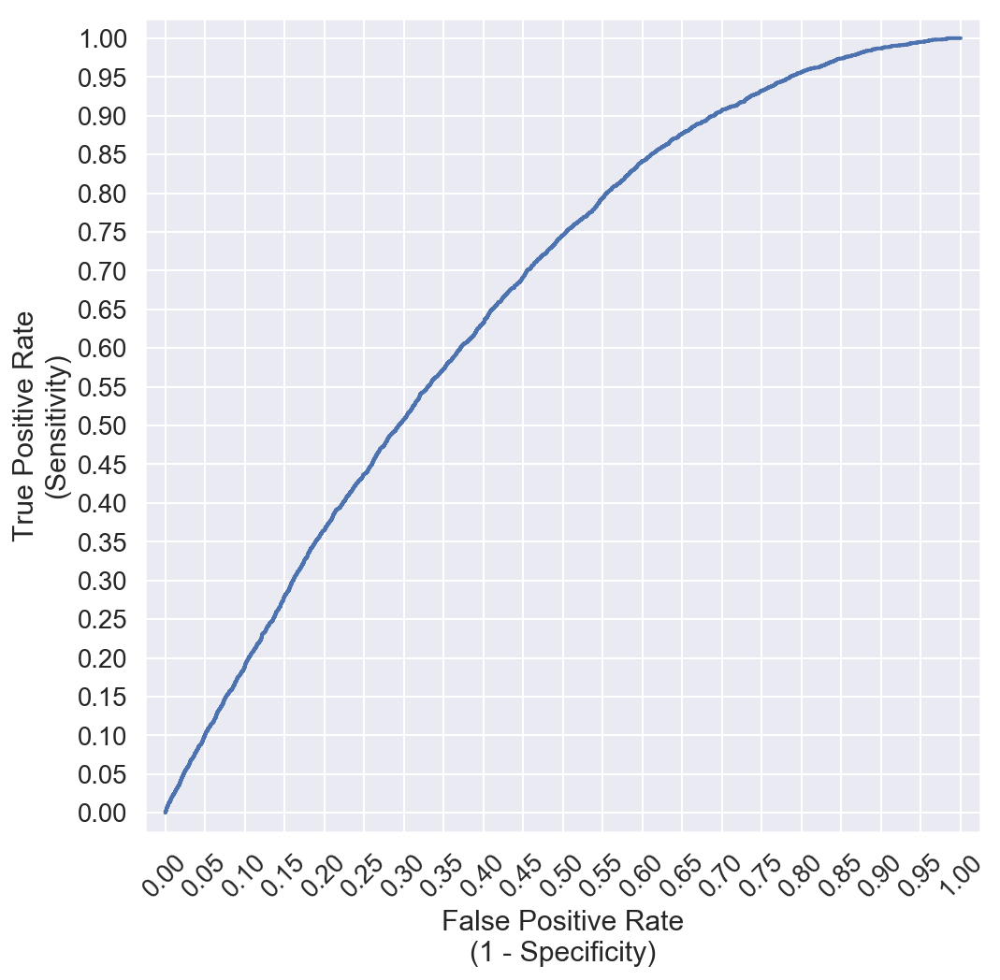

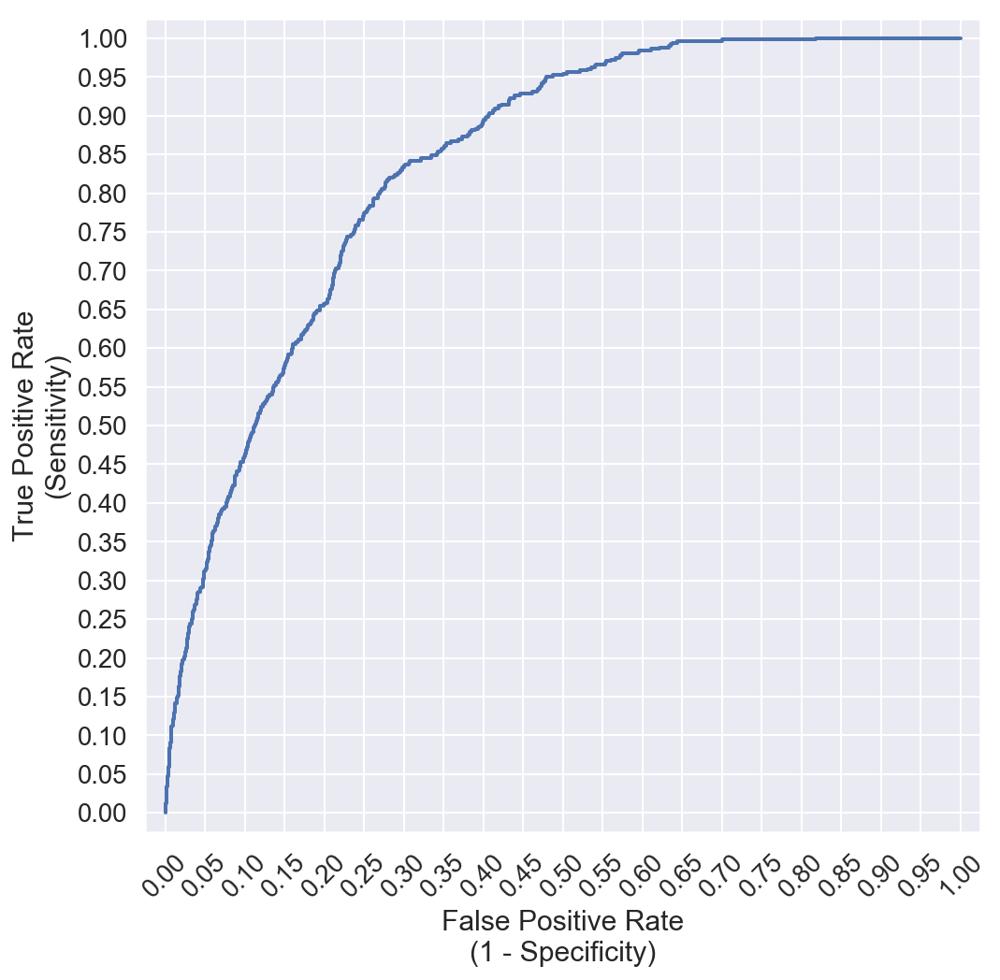

In [142]:
predicted_proba = pipeline.predict_proba(data_test["description_cleaned"])
plot_roc(data_test["points"].apply(lambda x: x == 85), predicted_proba[:, list(pipeline.classes_).index(85)])
plot_roc(data_test["points"].apply(lambda x: x == 90), predicted_proba[:, list(pipeline.classes_).index(90)])
plot_roc(data_test["points"].apply(lambda x: x == 95), predicted_proba[:, list(pipeline.classes_).index(95)])

In [143]:
print(data.all_words)

0         [aroma, includ, tropic, fruit, broom, brimston...
3         [pineappl, rind, lemon, pith, orang, blossom, ...
4         [much, like, regular, bottl, come, across, rat...
5         [blackberri, raspberri, aroma, show, typic, na...
6         [bright, inform, red, open, aroma, candi, berr...
9         [great, depth, flavor, fresh, appl, pear, frui...
10        [soft, suppl, plum, envelop, oaki, structur, c...
13        [domin, oak, oak, driven, aroma, includ, roast...
16        [bake, plum, molass, balsam, vinegar, cheesi, ...
17        [raw, black, cherri, aroma, direct, simpl, goo...
18        [desicc, blackberri, leather, char, wood, mint...
20        [ripe, aroma, dark, berri, mingl, ampl, note, ...
22        [delic, aroma, recal, white, flower, citru, pa...
23        [wine, geneseo, district, offer, aroma, sour, ...
24        [aroma, prune, blackcurr, toast, oak, carri, e...
25        [oak, earth, intermingl, around, robust, aroma...
26        [pretti, aroma, yellow, flower

In [144]:
# data['year'] = data['year'].fillna(data['year'].mode()[0])

In [145]:
# type_dummy = pd.get_dummies(data['all_words'])
# type_dummy.head()

In [146]:
wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(text)
plt.figure()
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

NameError: name 'text' is not defined

In [ ]:
# Save the image in the img folder:
wordcloud.to_file("img/first_review.png")

In [ ]:
text = " ".join(review for review in data.description)
print ("There are {} words in the combination of all review.".format(len(text)))

In [ ]:
# Create stopword list:
stopwords = set(STOPWORDS)
stopwords.update(["drink", "now", "wine", "flavor", "flavors"])

# Generate a word cloud image
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the generated image:
# the matplotlib way:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [184]:
import pickle
with open("data.pkl", "wb") as f:
    pickle.dump(data, f)

In [185]:
# Checkpoint to load df
import pickle
with open('data.pkl', "rb") as f:
    data = pickle.load(f)

In [186]:
from PIL import Image
from wordcloud import WordCloud
import math
import numpy as np
import scipy as sc
import pandas as pd

import pylab 
import scipy.stats as stats
import statsmodels.api as sm
from sklearn.svm import SVC
from sklearn.svm import LinearSVC
from sklearn import linear_model
from sklearn.utils import shuffle

from sklearn.neighbors import NearestNeighbors
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import KNeighborsRegressor
from sklearn import svm
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = (15, 9)
plt.style.use('ggplot')

from sklearn.externals import joblib
from sklearn.preprocessing import StandardScaler

from sklearn.preprocessing import scale
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import AdaBoostRegressor


from sklearn.ensemble import VotingClassifier

from sklearn.neural_network import MLPClassifier
from sklearn.neural_network import MLPRegressor

from sklearn.preprocessing import Normalizer

from sklearn.decomposition import TruncatedSVD
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics

from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.linear_model import ElasticNet

from sklearn import metrics
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeRegressor

In [187]:
pca_i = 20
vectorizer = TfidfVectorizer()
#vectorizer = TfidfVectorizer(stop_words=stopwords.words('english'))
vectorizer.fit(data.description_cleaned.tolist())
Tfidf_df = vectorizer.transform(data.description_cleaned.tolist())
my_normalizer1 = Normalizer()
my_normalizer1.fit(Tfidf_df)
Tfidf_df = my_normalizer1.transform(Tfidf_df)
svd1 = TruncatedSVD(n_components=pca_i, n_iter=7, random_state=42)
svd1.fit(Tfidf_df)

TruncatedSVD(algorithm='randomized', n_components=20, n_iter=7,
       random_state=42, tol=0.0)

In [188]:
def word_cloud_for_pca(component_i):
    old_component_i = component_i
    component_i = np.flip(np.argsort(svd1.explained_variance_ratio_),0)[component_i]
    
    pca_c_i = svd1.components_[component_i]
    high_indexes = np.where(np.abs(pca_c_i)>.03)
    my_features = vectorizer.get_feature_names()
    my_dic ={}
    for x in high_indexes[0]:
        my_dic[my_features[x]]= math.floor(pca_c_i[x]*1000)
    map_mask = np.array(Image.open("glass-bottle-wine.png"))
    wc = WordCloud(background_color="white", max_words=1000, mask=map_mask)
    wc.generate_from_frequencies(my_dic)
    plt.imshow(wc, interpolation='bilinear')
    variance_explained = round(abs(svd1.explained_variance_ratio_[component_i]) * 100,2)
    plt.title("principal component "+str(old_component_i+1) + " - Variance Explained "+str(variance_explained)+"%")
    plt.axis("off")
    plt.show()

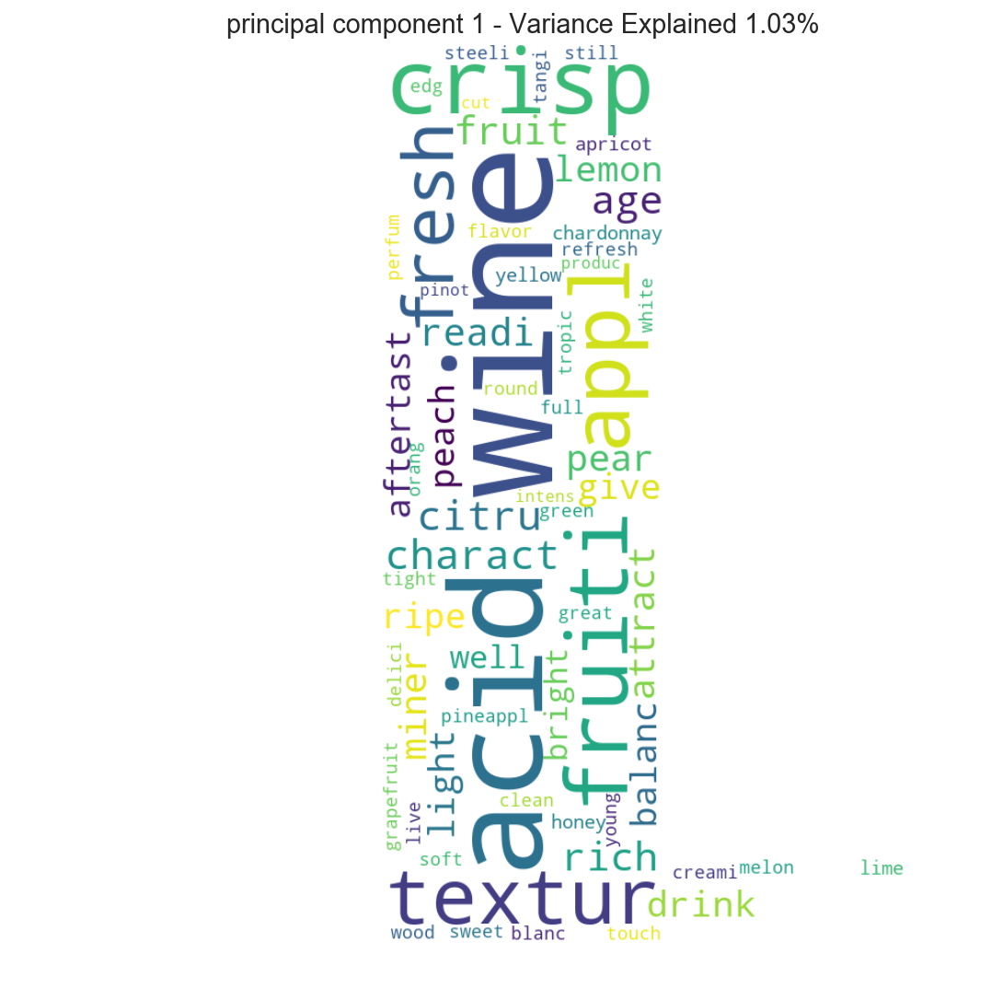

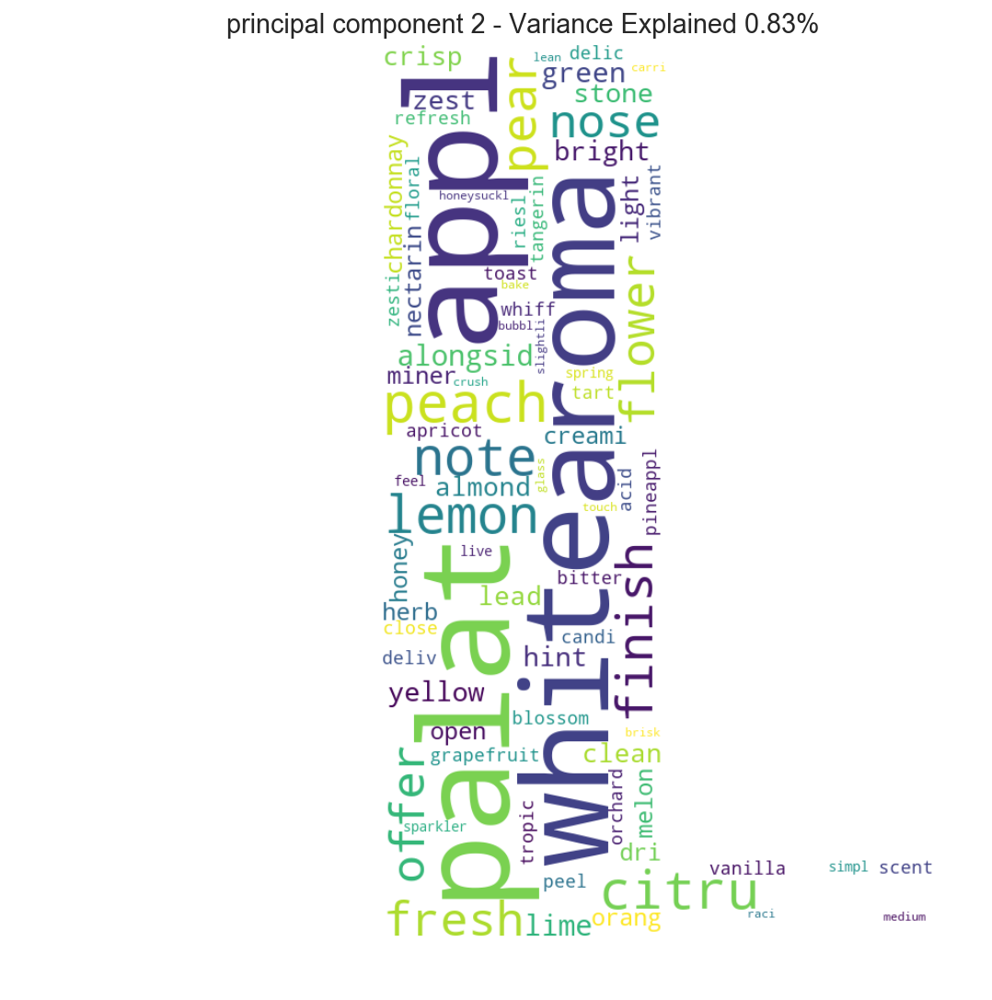

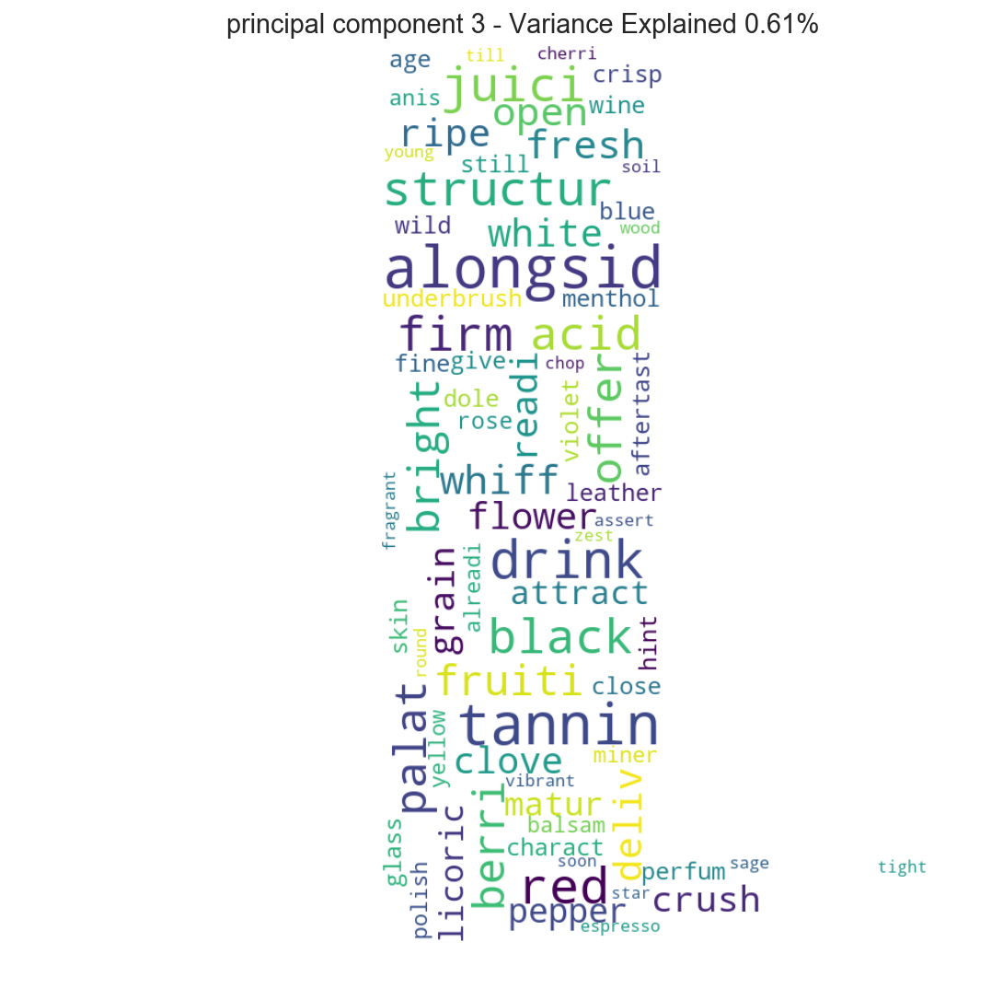

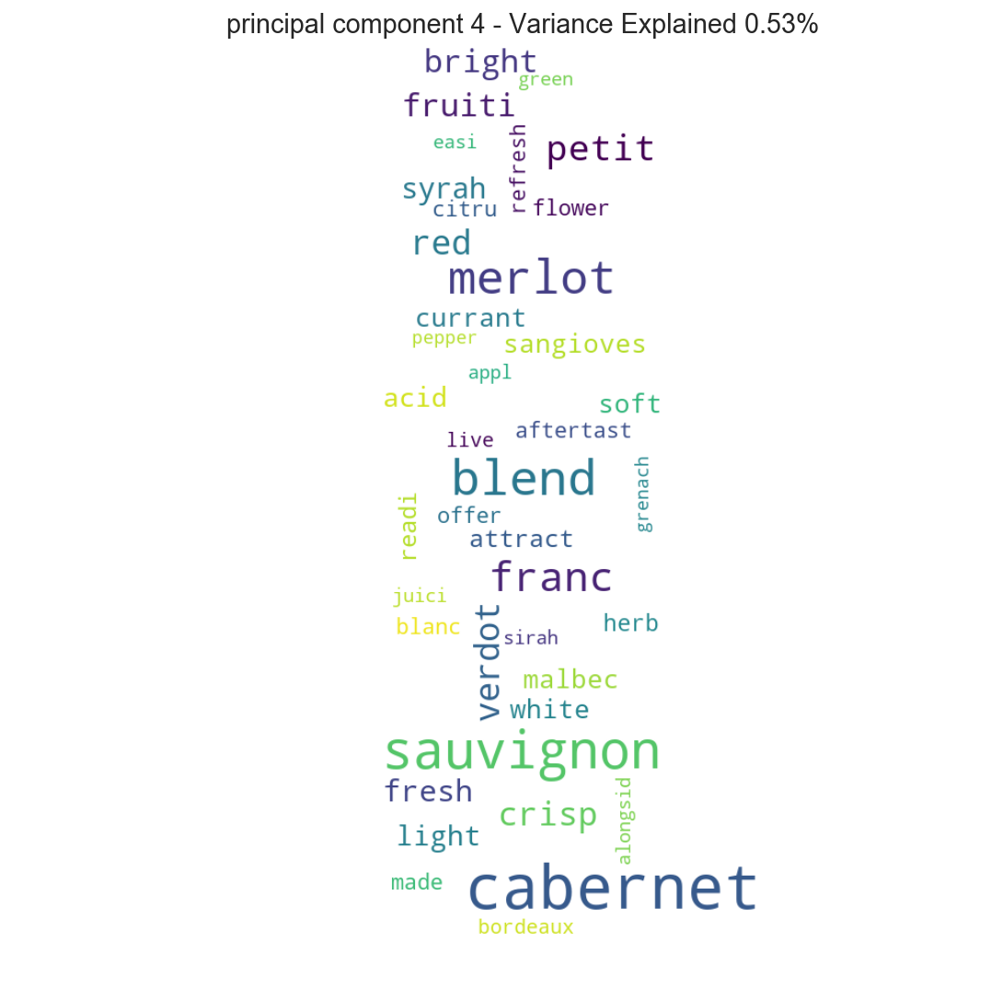

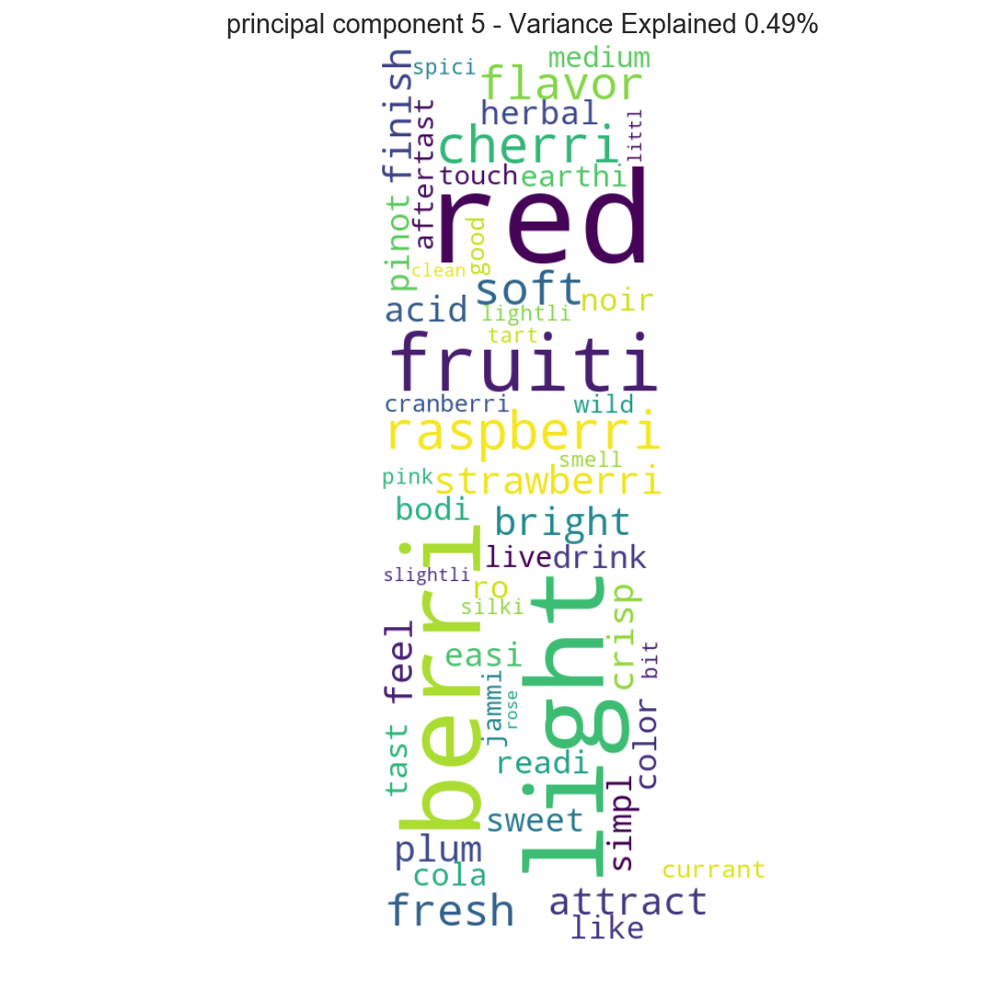

In [189]:
for i in range(0,5):
    word_cloud_for_pca(i)

In [190]:
# downsampling as dataframe is too large to work on this macbook after get_dummies
data_s = data.sample(frac=0.50, random_state=99)
data_s.shape

(34666, 20)

In [192]:
data_s.head()

,country,description,designation,points,price,province,region_1,taster_name,title,variety,winery,year,description_length,cleaned_description,rating,y_pred,Residuals,description_lengths,description_cleaned,all_words
91554,US,dull and vegetal tastes like canned asparagus...,Estate,80,19.0,California,Rutherford,unknown,Sawyer 2007 Estate Sauvignon Blanc (Rutherford),Sauvignon Blanc,Sawyer,2007.0,79,dull vegetal tastes like canned asparagus juic...,0,0.702325,-0.702325,13,dull veget tast like can asparagu juic squeez ...,"[dull, veget, tast, like, can, asparagu, juic,..."
117278,US,this cabernet has rich blackberry jam and blac...,Mohrhardt Ridge,90,20.0,California,Sonoma Coast,unknown,Wellington 2002 Mohrhardt Ridge Cabernet Sauvi...,Cabernet Sauvignon,Wellington,2002.0,263,cabernet rich black licorice flavors also funk...,3,2.338120,0.661880,47,cabernet rich blackberri jam black licoric fla...,"[cabernet, rich, blackberri, jam, black, licor..."
13875,US,tart and nervy this cool climate cabernet sau...,Reserve,87,37.0,New York,Finger Lakes,Anna Lee C. Iijima,Sheldrake Point 2012 Reserve Cabernet Sauvigno...,Cabernet Sauvignon,Sheldrake Point,2012.0,246,tart nervy cabernet sauvignon bristles fresh c...,2,2.186987,-0.186987,39,tart nervi cool climat cabernet sauvignon bris...,"[tart, nervi, cool, climat, cabernet, sauvigno..."
108673,Spain,here s a serious cava with champagne qualities...,III Lustros Gran Reserva,92,46.0,Catalonia,Cava,Michael Schachner,Gramona 2001 III Lustros Gran Reserva Sparklin...,Sparkling Blend,Gramona,2001.0,366,serious cava champagne qualities nose nutty ri...,3,3.253810,-0.253810,66,seriou cava champagn qualiti nose nutti rich h...,"[seriou, cava, champagn, qualiti, nose, nutti,..."
63590,US,this is a shy little wine with woodsy overton...,Vintner's Select,84,19.0,New York,Finger Lakes,unknown,Glenora 2007 Vintner's Select Syrah (Finger La...,Syrah,Glenora,2007.0,223,shy little wine woodsy overtones base plum ras...,1,1.982513,-0.982513,42,shi littl wine woodsi overton base plum raspbe...,"[shi, littl, wine, woodsi, overton, base, plum..."


In [193]:
def return_model_data_points(train_size, pca_i, input_df, keep_vars, save_tools = False):

#     category--> variety
    variety_df = pd.get_dummies(input_df[['variety']])
    variety_df = variety_df.drop(variety_df.columns[0], axis=1)
    variety_df = variety_df.reset_index(drop=True)
    
#    l5--> description_cleaned
    description_cleaned_df = pd.get_dummies(input_df[['description_cleaned']])
    description_cleaned_df = description_cleaned_df.drop(description_cleaned_df.columns[0], axis=1)
    description_cleaned_df = description_cleaned_df.reset_index(drop=True)
    
    dummy_df = pd.concat([variety_df,description_cleaned_df], axis=1)
    
    
    train_test_split_output = train_test_split(input_df, dummy_df,input_df[['points']] , random_state=1, test_size=1-train_size)

    df_train, df_test, dummy_df_train, dummy_df_test, y_train, y_test = train_test_split_output

    vectorizer = TfidfVectorizer()
    #vectorizer = TfidfVectorizer(stop_words=stopwords.words('english'))
    vectorizer.fit(df_train.description.tolist())

    Tfidf_df_train = vectorizer.transform(df_train.description.tolist())
    Tfidf_df_test = vectorizer.transform(df_test.description.tolist())

    input_df_train = df_train.reset_index(drop=True).copy(deep=True)
    input_df_test = df_test.reset_index(drop=True).copy(deep=True)

    my_normalizer1 = Normalizer()
    my_normalizer1.fit(Tfidf_df_train)

    Tfidf_df_train = my_normalizer1.transform(Tfidf_df_train)
    Tfidf_df_test = my_normalizer1.transform(Tfidf_df_test)

    svd1 = TruncatedSVD(n_components=pca_i, n_iter=7, random_state=42)
    svd1.fit(Tfidf_df_train)

    text_df_train = pd.DataFrame(svd1.transform(Tfidf_df_train))
    text_df_train = text_df_train.reset_index(drop=True)
    text_df_test = pd.DataFrame(svd1.transform(Tfidf_df_test))
    text_df_test = text_df_test.reset_index(drop=True)

    input_df_train = input_df_train.reset_index(drop=True)
    input_df_test = input_df_test.reset_index(drop=True)
    dummy_df_train = dummy_df_train.reset_index(drop=True)
    dummy_df_test = dummy_df_test.reset_index(drop=True)
    text_df_train = text_df_train.reset_index(drop=True)
    text_df_test = text_df_test.reset_index(drop=True)
    
    final_input_train = pd.concat([input_df_train[keep_vars],dummy_df_train,text_df_train], axis=1)
    final_input_test = pd.concat([input_df_test[keep_vars], dummy_df_test,text_df_test], axis=1)

    scaler = StandardScaler()
    scaler.fit(final_input_train)


    XTrain = scaler.transform(final_input_train)
    XTest = scaler.transform(final_input_test)

    return(XTrain, XTest, 
           y_train, y_test)

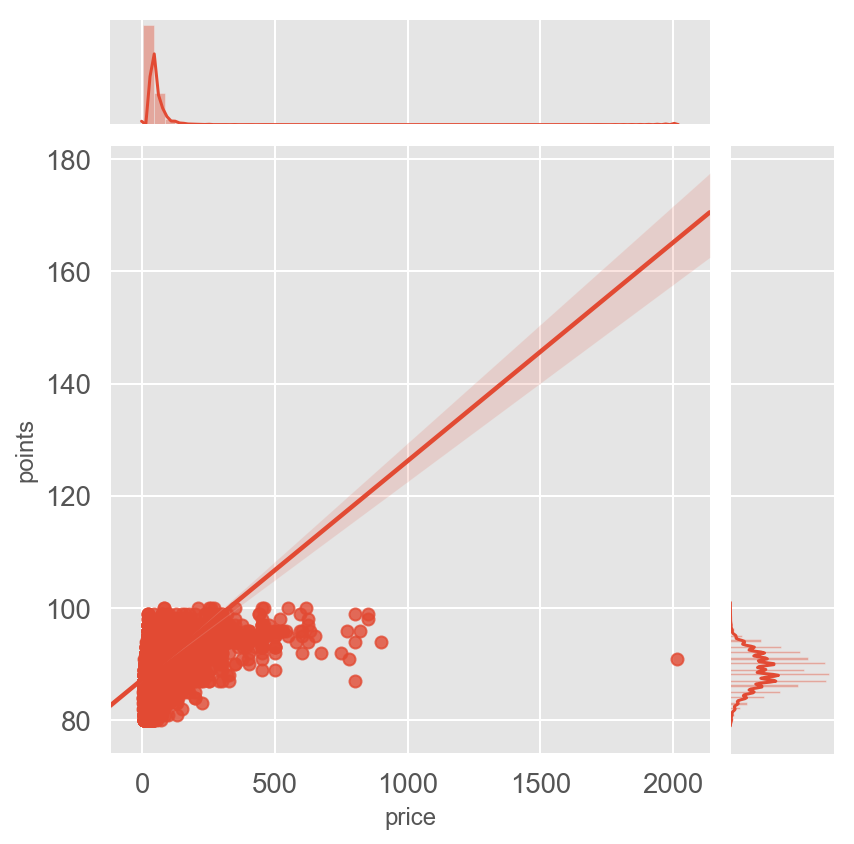

In [194]:
g = sns.jointplot("price", "points", data=data, kind="reg")

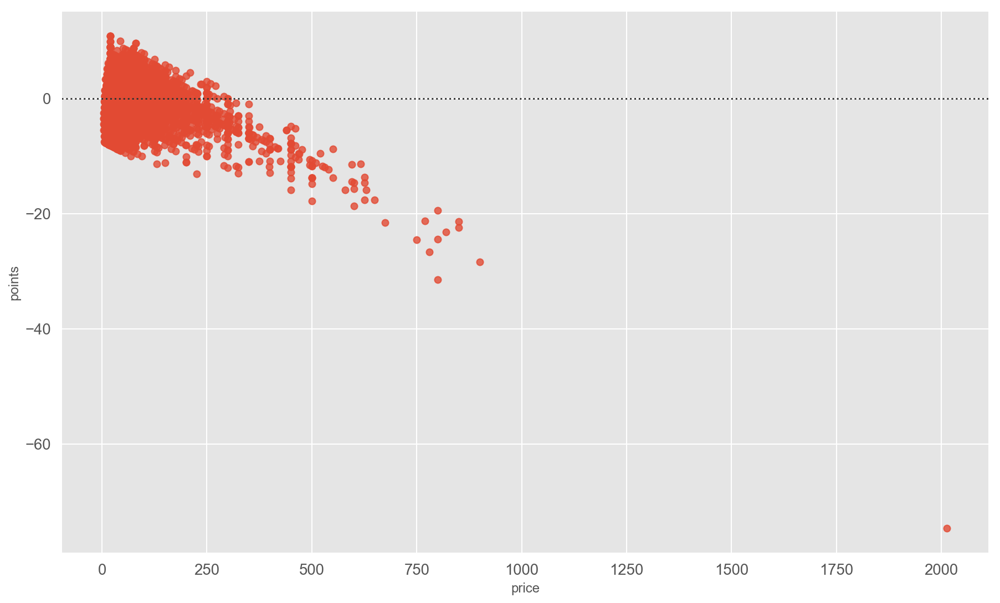

In [195]:
g = sns.residplot("price", "points", data=data)

In [196]:
results = sm.OLS(data[['points']], data[["price"]]).fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                 points   R-squared:                       0.556
Model:                            OLS   Adj. R-squared:                  0.556
Method:                 Least Squares   F-statistic:                 8.675e+04
Date:                Wed, 13 Mar 2019   Prob (F-statistic):               0.00
Time:                        01:53:04   Log-Likelihood:            -3.8135e+05
No. Observations:               69331   AIC:                         7.627e+05
Df Residuals:                   69330   BIC:                         7.627e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
price          1.2659      0.004    294.525      0.0

In [7]:
train_size=.2
pca_i=10
XTrain, XTest, y_train, y_test = return_model_data_points(train_size=train_size, pca_i=pca_i, input_df=data_s, keep_vars=['price'])

/Users/harzardbio/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/data.py:625: DataConversionWarning: Data with input dtype uint8, float32, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/Users/harzardbio/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:58: DataConversionWarning: Data with input dtype uint8, float32, float64 were all converted to float64 by StandardScaler.
/Users/harzardbio/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:59: DataConversionWarning: Data with input dtype uint8, float32, float64 were all converted to float64 by StandardScaler.


0.2 	 10 	 1.0 	 0.2839047037644661


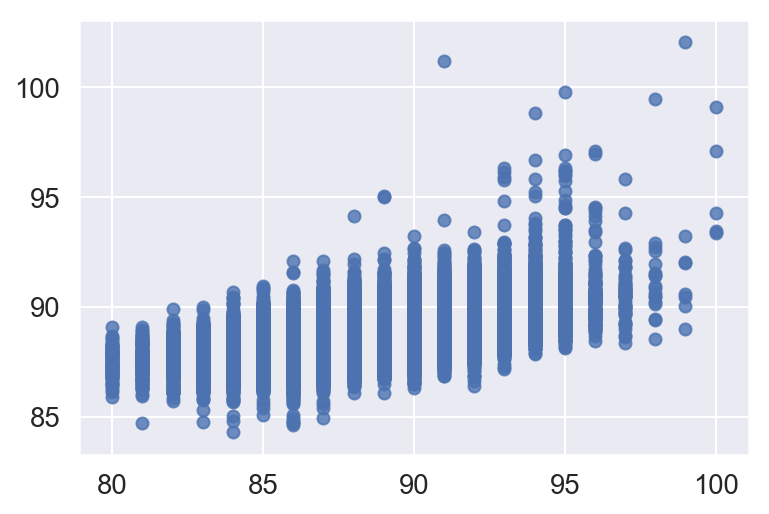

In [159]:
reg = linear_model.LinearRegression()
reg.fit (XTrain, y_train)
y_pred_train = reg.predict(XTrain)
y_pred_test = reg.predict(XTest)
print(train_size,"\t",pca_i, "\t",
      metrics.explained_variance_score(y_true = y_train, y_pred = y_pred_train),"\t",
      metrics.explained_variance_score(y_true = y_test, y_pred = y_pred_test))
sns.regplot(x=y_test, y=y_pred_test, fit_reg=False)

0.1 	 0.2 	 10 	 0.9999999998553089 	 0.2842409748031359
0.5 	 0.2 	 10 	 0.9999999963831172 	 0.2842370082188951
1.0 	 0.2 	 10 	 0.9999999855344417 	 0.28423205008669894
2.0 	 0.2 	 10 	 0.9999999421535457 	 0.28422213414934905
5.0 	 0.2 	 10 	 0.9999996387552634 	 0.2841923889541088
10.0 	 0.2 	 10 	 0.9999985569884201 	 0.2841428223545448
50.0 	 0.2 	 10 	 0.9999643144854973 	 0.2837466829658801
100.0 	 0.2 	 10 	 0.9998591704901061 	 0.28325249585650525


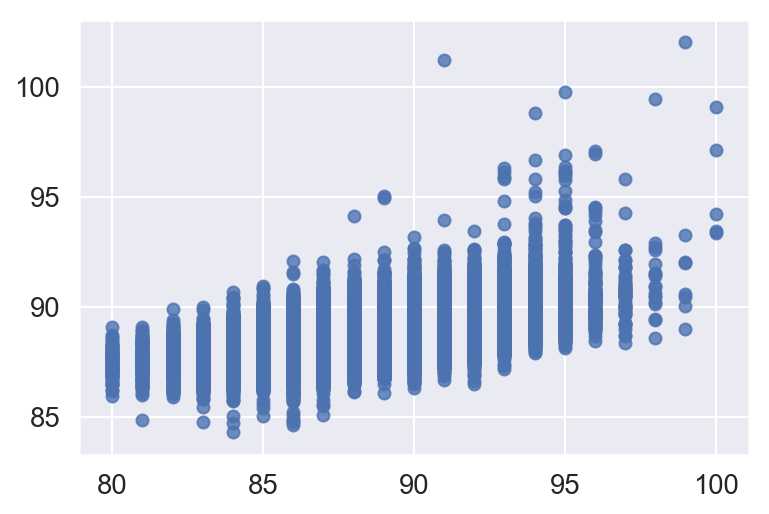

In [160]:
for i in [0.1,0.5,1.0,2.0,5.0,10.0,50.0,100.0]:
    reg = linear_model.Ridge(alpha=i)
    reg.fit (XTrain, y_train)
    y_pred_train = reg.predict(XTrain)
    y_pred_test = reg.predict(XTest)
    print(i,"\t",train_size,"\t",pca_i, "\t",
          metrics.explained_variance_score(y_true = y_train, y_pred = y_pred_train),"\t",
          metrics.explained_variance_score(y_true = y_test, y_pred = y_pred_test))
sns.regplot(x=y_test, y=y_pred_test, fit_reg=False)

In [161]:
for i in [0.01,.1,.2,.3,.4,.5,.6,.7,.8,.9,1]:
    reg = linear_model.Lasso(alpha = i)
    reg.fit (XTrain, y_train)
    y_pred_train = reg.predict(XTrain)
    y_pred_test = reg.predict(XTest)
    print(i,"\t",train_size,"\t",pca_i, "\t",
          metrics.explained_variance_score(y_true = y_train, y_pred = y_pred_train),"\t",
          metrics.explained_variance_score(y_true = y_test, y_pred = y_pred_test))

0.01 	 0.2 	 10 	 0.9423112109039499 	 0.3435525726630573
0.1 	 0.2 	 10 	 0.333974652906012 	 0.3294555096117707
0.2 	 0.2 	 10 	 0.2904440851892539 	 0.2958339911588923
0.3 	 0.2 	 10 	 0.2511725333615865 	 0.26092065133470654
0.4 	 0.2 	 10 	 0.2191289354687863 	 0.2290394397795309
0.5 	 0.2 	 10 	 0.19129578599219055 	 0.19993887124329812
0.6 	 0.2 	 10 	 0.16007460273195961 	 0.16766395093015707
0.7 	 0.2 	 10 	 0.14085559384410717 	 0.1464809282547167
0.8 	 0.2 	 10 	 0.12556232016253877 	 0.12947361080634112
0.9 	 0.2 	 10 	 0.10822994332342872 	 0.11073420278555923
1 	 0.2 	 10 	 0.08885846332677572 	 0.09026270419237092


In [162]:
for i in [0.01,.1,.25,.5,.75,1]:
    for j in [0.01,.1,.2,.3,.4,.5,.6,.7,.8,.9,1]:
        reg = linear_model.ElasticNet(alpha = i, l1_ratio=j)
        reg.fit (XTrain, y_train)
        y_pred_train = reg.predict(XTrain)
        y_pred_test = reg.predict(XTest)
        print(i,"\t",j,"\t",train_size,"\t",pca_i, "\t",
              metrics.explained_variance_score(y_true = y_train, y_pred = y_pred_train),"\t",
              metrics.explained_variance_score(y_true = y_test, y_pred = y_pred_test))

0.01 	 0.01 	 0.2 	 10 	 0.9998931171295314 	 0.2981513368029505
0.01 	 0.1 	 0.2 	 10 	 0.9989704062903793 	 0.33881956653692713
0.01 	 0.2 	 0.2 	 10 	 0.9967686181224557 	 0.3457358793115294
0.01 	 0.3 	 0.2 	 10 	 0.9933987448707647 	 0.3464691199327061
0.01 	 0.4 	 0.2 	 10 	 0.9889128880897515 	 0.3462405788113825
0.01 	 0.5 	 0.2 	 10 	 0.9833833765614068 	 0.3458293550337328
0.01 	 0.6 	 0.2 	 10 	 0.9768724160835424 	 0.3453696785343111
0.01 	 0.7 	 0.2 	 10 	 0.9694325599321159 	 0.3448235945495486
0.01 	 0.8 	 0.2 	 10 	 0.9611463893880778 	 0.3443814257206854
0.01 	 0.9 	 0.2 	 10 	 0.9520907391569252 	 0.3439222991230534
0.01 	 1 	 0.2 	 10 	 0.9423112109039499 	 0.3435525726630573
0.1 	 0.01 	 0.2 	 10 	 0.9909179631300155 	 0.2929358431451241
0.1 	 0.1 	 0.2 	 10 	 0.9206843674816663 	 0.3368793856308946
0.1 	 0.2 	 0.2 	 10 	 0.7914852551637368 	 0.3445501101568702
0.1 	 0.3 	 0.2 	 10 	 0.6537820383773831 	 0.3458332681204217
0.1 	 0.4 	 0.2 	 10 	 0.5357456388284398 	

0.2 	 10 	 0.9999999999999447 	 0.2842419470701435


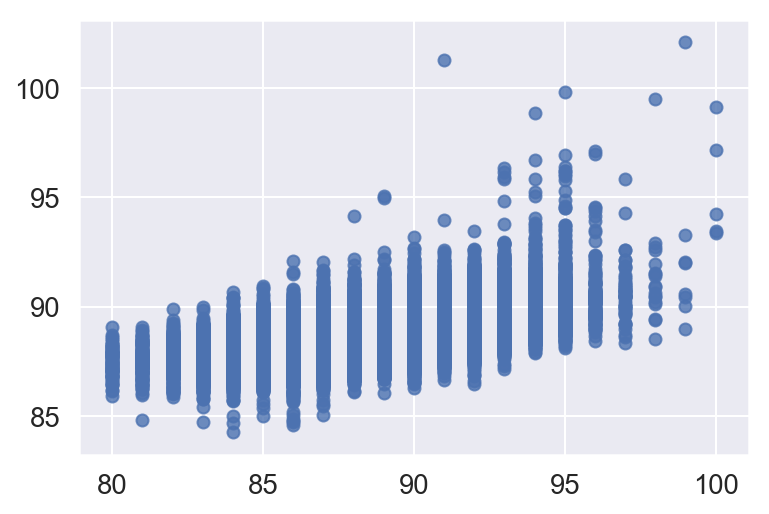

In [163]:
reg = linear_model.BayesianRidge()
reg.fit (XTrain, np.ravel(y_train))
y_pred_train = reg.predict(XTrain)
y_pred_test = reg.predict(XTest)
print(train_size,"\t",pca_i, "\t",
      metrics.explained_variance_score(y_true = y_train, y_pred = y_pred_train),"\t",
      metrics.explained_variance_score(y_true = y_test, y_pred = y_pred_test))
sns.regplot(x=y_test, y=y_pred_test, fit_reg=False)

/Users/harzardbio/anaconda3/lib/python3.6/site-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


0.2 	 10 	 0.2216260359266693 	 0.07732386759316956


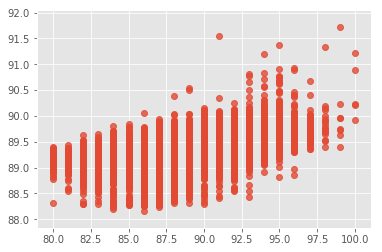

In [8]:
reg = svm.SVR()
reg.fit (XTrain, np.ravel(y_train))
y_pred_train = reg.predict(XTrain)
y_pred_test = reg.predict(XTest)
print(train_size,"\t",pca_i, "\t",
      metrics.explained_variance_score(y_true = y_train, y_pred = y_pred_train),"\t",
      metrics.explained_variance_score(y_true = y_test, y_pred = y_pred_test))
sns.regplot(x=y_test, y=y_pred_test, fit_reg=False)

0.2 	 10 	 0.5436320839644129 	 0.3098059759737609


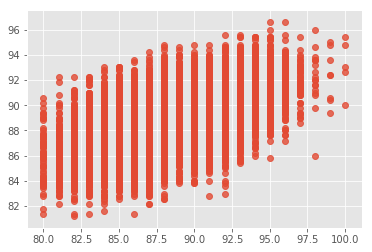

In [9]:
reg = KNeighborsRegressor(n_neighbors=5)
reg.fit (XTrain, np.ravel(y_train))
y_pred_train = reg.predict(XTrain)
y_pred_test = reg.predict(XTest)
print(train_size,"\t",pca_i, "\t",
      metrics.explained_variance_score(y_true = y_train, y_pred = y_pred_train),"\t",
      metrics.explained_variance_score(y_true = y_test, y_pred = y_pred_test))
sns.regplot(x=y_test, y=y_pred_test, fit_reg=False)

In [10]:
for i  in [1,3,5,7,9,11,13,15]:
    reg = DecisionTreeRegressor(max_depth=i)
    reg.fit (XTrain, np.ravel(y_train))
    y_pred_train = reg.predict(XTrain)
    y_pred_test = reg.predict(XTest)
    print(i,"\t",train_size,"\t",pca_i, "\t",
          metrics.explained_variance_score(y_true = y_train, y_pred = y_pred_train),"\t",
          metrics.explained_variance_score(y_true = y_test, y_pred = y_pred_test))

1 	 0.2 	 10 	 0.2146953141074437 	 0.2194608385198148
3 	 0.2 	 10 	 0.3398001267012424 	 0.32952231652099295
5 	 0.2 	 10 	 0.41242403061792143 	 0.359575149096514
7 	 0.2 	 10 	 0.49697643427276994 	 0.3613152102726003
9 	 0.2 	 10 	 0.5912087211178538 	 0.31964568054296727
11 	 0.2 	 10 	 0.6811634045089354 	 0.2648281995339542
13 	 0.2 	 10 	 0.7633017940763598 	 0.19251796047013414
15 	 0.2 	 10 	 0.8266140585798712 	 0.1415660412406905


/Users/harzardbio/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


1 	 0.2 	 10 	 0.08293608879788084 	 0.08535870475736473


/Users/harzardbio/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


3 	 0.2 	 10 	 0.25312416788771186 	 0.25099220354748686


/Users/harzardbio/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


5 	 0.2 	 10 	 0.3407838074942121 	 0.3192464143023166


/Users/harzardbio/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


7 	 0.2 	 10 	 0.42673359780353237 	 0.3760737397677112


/Users/harzardbio/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


9 	 0.2 	 10 	 0.5405590160502298 	 0.4243561316906036


/Users/harzardbio/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


11 	 0.2 	 10 	 0.6144121783771628 	 0.4286432295128665


/Users/harzardbio/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


13 	 0.2 	 10 	 0.6844264479561724 	 0.4415649052750922


/Users/harzardbio/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


15 	 0.2 	 10 	 0.7595919952563561 	 0.4472078779234049


/Users/harzardbio/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


17 	 0.2 	 10 	 0.8159786410342416 	 0.4476422309248832


/Users/harzardbio/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


19 	 0.2 	 10 	 0.8675811050646186 	 0.4505120685179804


/Users/harzardbio/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


21 	 0.2 	 10 	 0.8890248184680343 	 0.4537574907471671


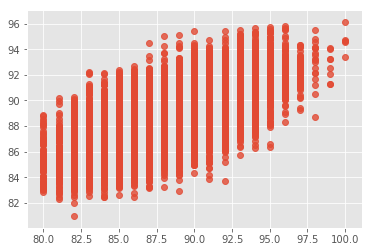

In [11]:
for i  in [1,3,5,7,9,11,13,15,17,19,21]:
    reg = ExtraTreesRegressor(max_depth=i)
    reg.fit (XTrain, np.ravel(y_train))
    y_pred_train = reg.predict(XTrain)
    y_pred_test = reg.predict(XTest)
    print(i,"\t",train_size,"\t",pca_i, "\t",
          metrics.explained_variance_score(y_true = y_train, y_pred = y_pred_train),"\t",
          metrics.explained_variance_score(y_true = y_test, y_pred = y_pred_test))
sns.regplot(x=y_test, y=y_pred_test, fit_reg=False)

/Users/harzardbio/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


1 	 0.2 	 10 	 0.23026701706362906 	 0.2377037079483637


/Users/harzardbio/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


3 	 0.2 	 10 	 0.3666423429733745 	 0.3566249163096009


/Users/harzardbio/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


5 	 0.2 	 10 	 0.45069203504860067 	 0.40681908074437356


/Users/harzardbio/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


7 	 0.2 	 10 	 0.5323827416521312 	 0.4264378978480713


/Users/harzardbio/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


9 	 0.2 	 10 	 0.6213928372188398 	 0.43374263005254565


/Users/harzardbio/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


11 	 0.2 	 10 	 0.6960587646497014 	 0.44035485823284615


/Users/harzardbio/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


13 	 0.2 	 10 	 0.7524114061637501 	 0.4297527309488657


/Users/harzardbio/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


15 	 0.2 	 10 	 0.8100044552193946 	 0.43064225958633706


/Users/harzardbio/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


17 	 0.2 	 10 	 0.8426122713416573 	 0.4272951318746777


/Users/harzardbio/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


19 	 0.2 	 10 	 0.8654297901394804 	 0.42240710076481713


/Users/harzardbio/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


21 	 0.2 	 10 	 0.8756456114410682 	 0.4213188723106799


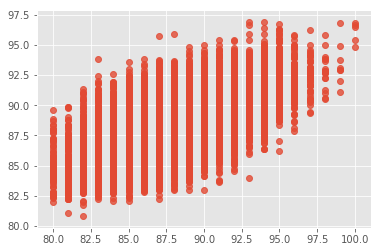

In [12]:
for i  in [1,3,5,7,9,11,13,15,17,19,21]:
    reg = RandomForestRegressor(max_depth=i)
    reg.fit (XTrain, np.ravel(y_train))
    y_pred_train = reg.predict(XTrain)
    y_pred_test = reg.predict(XTest)
    print(i,"\t",train_size,"\t",pca_i, "\t",
          metrics.explained_variance_score(y_true = y_train, y_pred = y_pred_train),"\t",
          metrics.explained_variance_score(y_true = y_test, y_pred = y_pred_test))
sns.regplot(x=y_test, y=y_pred_test, fit_reg=False)

0.2 	 10 	 0.8968871900117796 	 0.4182764096578522


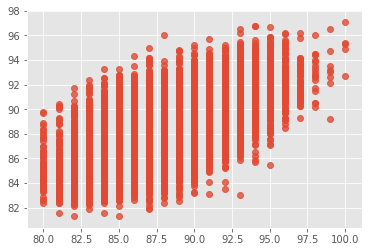

In [13]:
reg = BaggingRegressor()
reg.fit (XTrain, np.ravel(y_train))
y_pred_train = reg.predict(XTrain)
y_pred_test = reg.predict(XTest)
print(train_size,"\t",pca_i, "\t",
      metrics.explained_variance_score(y_true = y_train, y_pred = y_pred_train),"\t",
      metrics.explained_variance_score(y_true = y_test, y_pred = y_pred_test))
sns.regplot(x=y_test, y=y_pred_test, fit_reg=False)

0.2 	 10 	 0.41706525618325274 	 0.3899861197629606


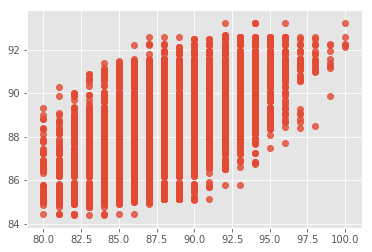

In [14]:
reg = AdaBoostRegressor()
reg.fit (XTrain, np.ravel(y_train))
y_pred_train = reg.predict(XTrain)
y_pred_test = reg.predict(XTest)
print(train_size,"\t",pca_i, "\t",
      metrics.explained_variance_score(y_true = y_train, y_pred = y_pred_train),"\t",
      metrics.explained_variance_score(y_true = y_test, y_pred = y_pred_test))
sns.regplot(x=y_test, y=y_pred_test, fit_reg=False)

0.2 	 10 	 0.5275225473499525 	 0.45813647964957294


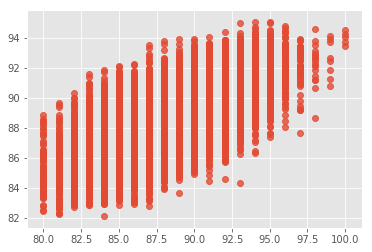

In [15]:
reg = GradientBoostingRegressor()
reg.fit (XTrain, np.ravel(y_train))
y_pred_train = reg.predict(XTrain)
y_pred_test = reg.predict(XTest)
print(train_size,"\t",pca_i, "\t",
      metrics.explained_variance_score(y_true = y_train, y_pred = y_pred_train),"\t",
      metrics.explained_variance_score(y_true = y_test, y_pred = y_pred_test))
sns.regplot(x=y_test, y=y_pred_test, fit_reg=False)

0.2 	 10 	 0.9996759784760979 	 -41.25931600523718


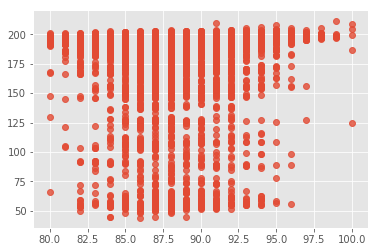

In [16]:
reg = MLPRegressor()
reg.fit (XTrain, np.ravel(y_train))
y_pred_train = reg.predict(XTrain)
y_pred_test = reg.predict(XTest)
print(train_size,"\t",pca_i, "\t",
      metrics.explained_variance_score(y_true = y_train, y_pred = y_pred_train),"\t",
      metrics.explained_variance_score(y_true = y_test, y_pred = y_pred_test))
sns.regplot(x=y_test, y=y_pred_test, fit_reg=False)

/Users/harzardbio/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/data.py:625: DataConversionWarning: Data with input dtype int32 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/Users/harzardbio/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: DataConversionWarning: Data with input dtype int32 were all converted to float64 by StandardScaler.
  """


0.2 	 10 	 0.9843985889970756 	 0.19302792489407028


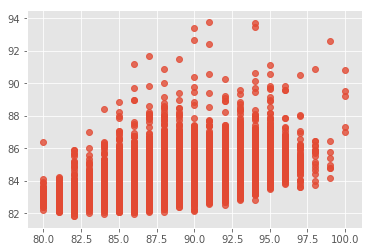

In [17]:
scalery = StandardScaler()
scalery.fit(y_train)

reg = MLPRegressor( activation="logistic")
reg.fit (XTrain, np.ravel(scalery.transform(y_train)))
y_pred_train = scalery.inverse_transform(reg.predict(XTrain))
y_pred_test = scalery.inverse_transform(reg.predict(XTest))
print(train_size,"\t",pca_i, "\t",
      metrics.explained_variance_score(y_true = y_train, y_pred = y_pred_train),"\t",
      metrics.explained_variance_score(y_true = y_test, y_pred = y_pred_test))
sns.regplot(x=y_test, y=y_pred_test, fit_reg=False)

## Analysis Classification Methodology

In [197]:
def return_model_data(train_size, pca_i, input_df, keep_vars, save_tools = False):
#   category--> variety
#   l5--> country
#   taster--> taster_name
    lookupTable1, indexed_1 = np.unique(input_df[['taster_name']],   return_inverse=True)
    lookupTable2, indexed_2 = np.unique(input_df[['variety']], return_inverse=True)
    lookupTable3, indexed_3 = np.unique(input_df[['country']], return_inverse=True)

    train_test_split_output = train_test_split(input_df, indexed_1,indexed_2,indexed_3, random_state=1, test_size=1-train_size)

    df_train, df_test, y1_train, y1_test, y2_train, y2_test, y3_train, y3_test = train_test_split_output

    vectorizer = TfidfVectorizer()
    #vectorizer = TfidfVectorizer(stop_words=stopwords.words('english'))
    vectorizer.fit(df_train.description_cleaned.tolist())
    if save_tools:
        joblib.dump(vectorizer, 'vectorizer.pkl')

#   description--> description_cleaned
    Tfidf_df_train = vectorizer.transform(df_train.description_cleaned.tolist())
    Tfidf_df_test = vectorizer.transform(df_test.description_cleaned.tolist())

    input_df_train = df_train.reset_index(drop=True).copy(deep=True)
    input_df_test = df_test.reset_index(drop=True).copy(deep=True)

    my_normalizer1 = Normalizer()
    my_normalizer1.fit(Tfidf_df_train)
    if save_tools:
        joblib.dump(normalizer1, 'normalizer1.pkl')

    Tfidf_df_train = my_normalizer1.transform(Tfidf_df_train)
    Tfidf_df_test = my_normalizer1.transform(Tfidf_df_test)

    svd1 = TruncatedSVD(n_components=pca_i, n_iter=7, random_state=42)
    svd1.fit(Tfidf_df_train)
    if save_tools:
        joblib.dump(svd1, 'svd1.pkl')

    text_df_train = pd.DataFrame(svd1.transform(Tfidf_df_train))
    text_df_train = text_df_train.reset_index(drop=True)
    text_df_test = pd.DataFrame(svd1.transform(Tfidf_df_test))
    text_df_test = text_df_test.reset_index(drop=True)

    final_input_train = pd.concat([input_df_train[keep_vars],text_df_train], axis=1)
    final_input_test = pd.concat([input_df_test[keep_vars],text_df_test], axis=1)

    scaler = StandardScaler()
    scaler.fit(final_input_train)
    if save_tools:
        joblib.dump(scaler, 'scaler.pkl')

    XTrain = scaler.transform(final_input_train)
    XTest = scaler.transform(final_input_test)

    return(XTrain, XTest, 
           y1_train, y1_test, 
           y2_train, y2_test, 
           y3_train, y3_test,
           lookupTable1,lookupTable2,lookupTable3,

           vectorizer,my_normalizer1,svd1,scaler)

In [198]:
from IPython.core.display import HTML
train_size=.01
pca_i=10
# df2--> data_s
output_data = return_model_data(train_size=train_size, pca_i=pca_i, input_df=data_s, keep_vars=['points','price'])
XTrain, XTest, y1_train, y1_test, y2_train, y2_test, y3_train, y3_test,lookupTable1,lookupTable2,lookupTable3,vectorizer,normalizer1,svd1,scaler = output_data

In [ ]:
bgc = BaggingClassifier(random_state=41)
bgc.fit(XTrain, y2_train)  
y_pred_train = bgc.predict(XTrain)
y_pred_test = bgc.predict(XTest)
print(train_size,"\t",pca_i, "\t",
      metrics.accuracy_score(y_true = y2_train, y_pred = y_pred_train),"\t",
      metrics.accuracy_score(y_true = y2_test, y_pred = y_pred_test))
display(HTML(pd.DataFrame(metrics.confusion_matrix(y_true=y2_test, y_pred=y_pred_test)).to_html()))

In [199]:
svc = SVC(kernel='rbf',C=3)
svc.fit(XTrain, y2_train)  
y_pred_train = svc.predict(XTrain)
y_pred_test = svc.predict(XTest)
print(train_size,"\t",pca_i, "\t",
      metrics.accuracy_score(y_true = y2_train, y_pred = y_pred_train),"\t",
      metrics.accuracy_score(y_true = y2_test, y_pred = y_pred_test))
display(HTML(pd.DataFrame(metrics.confusion_matrix(y_true=y2_test, y_pred=y_pred_test)).to_html()))

0.01 	 10 	 0.8497109826589595 	 0.26328671328671327


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,2,0,0,0,0,0,11,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,11,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,15,0,0,0,0,0,0,0,0,0,0,0,0,0,0,57,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,2,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [ ]:
rfc = RandomForestClassifier( random_state=41,n_jobs=-1)
rfc.fit(XTrain, y2_train)  
y_pred_train = rfc.predict(XTrain)
y_pred_test = rfc.predict(XTest)
print(train_size,"\t",pca_i, "\t",
      metrics.accuracy_score(y_true = y2_train, y_pred = y_pred_train),"\t",
      metrics.accuracy_score(y_true = y2_test, y_pred = y_pred_test))
display(HTML(pd.DataFrame(metrics.confusion_matrix(y_true=y2_test, y_pred=y_pred_test)).to_html()))

In [200]:
rfc = RandomForestClassifier( random_state=41,n_jobs=-1)
rfc.fit(XTrain, y2_train)  
y_pred_train = rfc.predict(XTrain)
y_pred_test = rfc.predict(XTest)
print(train_size,"\t",pca_i, "\t",
      metrics.accuracy_score(y_true = y2_train, y_pred = y_pred_train),"\t",
      metrics.accuracy_score(y_true = y2_test, y_pred = y_pred_test))
display(HTML(pd.DataFrame(metrics.confusion_matrix(y_true=y2_test, y_pred=y_pred_test)).to_html()))

0.01 	 10 	 0.9884393063583815 	 0.21115967365967367


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,1,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,14,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,19,0,0,0,0,0,0,0,0,0,0,0,0,0,0,43,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,3,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [208]:
for n_neighbors in range(2,8):
    knc = KNeighborsClassifier(n_neighbors=n_neighbors)
    gbc.fit(XTrain, y1_train)  
    y_pred_train = gbc.predict(XTrain)
    y_pred_test = gbc.predict(XTest)
    print(n_neighbors,"\t",train_size,"\t",pca_i, "\t",
          metrics.accuracy_score(y_true = y1_train, y_pred = y_pred_train),"\t",
          metrics.accuracy_score(y_true = y1_test, y_pred = y_pred_test))
display(HTML(pd.DataFrame(metrics.confusion_matrix(y_true=y1_test, y_pred=y_pred_test)).to_html()))

2 	 0.1 	 50 	 0.9942296595499135 	 0.7507051282051282
3 	 0.1 	 50 	 0.9942296595499135 	 0.7507051282051282
4 	 0.1 	 50 	 0.9942296595499135 	 0.7507051282051282
5 	 0.1 	 50 	 0.9942296595499135 	 0.7507051282051282
6 	 0.1 	 50 	 0.9942296595499135 	 0.7507051282051282
7 	 0.1 	 50 	 0.9942296595499135 	 0.7507051282051282


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,0,2,0,0,0,0,1,4,8,0,12,19,9,0,2,0,22,30
1,0,180,6,0,0,0,3,13,11,1,21,27,29,7,3,0,35,382
2,0,32,225,0,0,0,0,7,2,0,54,16,32,15,1,0,23,65
3,0,1,0,0,0,0,0,1,2,0,1,10,3,1,0,0,6,22
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
5,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,4
6,0,6,0,0,0,0,572,18,1,1,7,35,46,44,4,1,91,251
7,0,11,2,0,0,0,19,272,7,3,23,107,144,11,3,0,101,316
8,0,2,1,0,0,0,2,2,2777,0,12,27,16,12,3,0,15,202
9,0,2,1,0,0,0,0,12,14,5,11,45,8,3,2,0,10,68


In [209]:
for n_neighbors in range(2,8):
    knc = KNeighborsClassifier(n_neighbors=n_neighbors)
    gbc.fit(XTrain, y2_train)  
    y_pred_train = gbc.predict(XTrain)
    y_pred_test = gbc.predict(XTest)
    print(n_neighbors,"\t",train_size,"\t",pca_i, "\t",
          metrics.accuracy_score(y_true = y2_train, y_pred = y_pred_train),"\t",
          metrics.accuracy_score(y_true = y2_test, y_pred = y_pred_test))
display(HTML(pd.DataFrame(metrics.confusion_matrix(y_true=y2_test, y_pred=y_pred_test)).to_html()))

2 	 0.1 	 50 	 0.7680323139065205 	 0.26490384615384616
3 	 0.1 	 50 	 0.7680323139065205 	 0.26490384615384616
4 	 0.1 	 50 	 0.7680323139065205 	 0.26490384615384616
5 	 0.1 	 50 	 0.7680323139065205 	 0.26490384615384616
6 	 0.1 	 50 	 0.7680323139065205 	 0.26490384615384616
7 	 0.1 	 50 	 0.7680323139065205 	 0.26490384615384616


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,11,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,23,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,21,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,19,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,11,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,4,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [210]:
for n_neighbors in range(2,8):
    knc = KNeighborsClassifier(n_neighbors=n_neighbors)
    gbc.fit(XTrain, y3_train)  
    y_pred_train = gbc.predict(XTrain)
    y_pred_test = gbc.predict(XTest)
    print(n_neighbors,"\t",train_size,"\t",pca_i, "\t",
          metrics.accuracy_score(y_true = y3_train, y_pred = y_pred_train),"\t",
          metrics.accuracy_score(y_true = y3_test, y_pred = y_pred_test))
display(HTML(pd.DataFrame(metrics.confusion_matrix(y_true=y3_test, y_pred=y_pred_test)).to_html()))

2 	 0.1 	 50 	 0.9780727062896711 	 0.8233653846153847
3 	 0.1 	 50 	 0.9780727062896711 	 0.8233653846153847
4 	 0.1 	 50 	 0.9780727062896711 	 0.8233653846153847
5 	 0.1 	 50 	 0.9780727062896711 	 0.8233653846153847
6 	 0.1 	 50 	 0.9780727062896711 	 0.8233653846153847
7 	 0.1 	 50 	 0.9780727062896711 	 0.8233653846153847


,0,1,2,3,4,5,6
0,276,1,0,7,17,553,354
1,3,62,0,30,13,20,589
2,0,0,0,1,4,1,65
3,8,30,0,4779,82,33,993
4,4,3,1,104,4814,14,882
5,292,4,0,21,51,1112,711
6,19,8,1,245,253,94,14646


In [ ]:
data_s.head()

In [202]:
train_size=.1
pca_i=50
output_data = return_model_data(train_size=train_size, pca_i=pca_i, input_df=data_s, keep_vars=['points','price','description_length'])
XTrain, XTest, y1_train, y1_test, y2_train, y2_test, y3_train, y3_test,lookupTable1,lookupTable2,lookupTable3,vectorizer,normalizer1,svd1,scaler = output_data

In [203]:
mlpc = MLPClassifier(solver='lbfgs', alpha=1e-5, random_state=41)
bgc = BaggingClassifier(random_state=41)
abc = AdaBoostClassifier(random_state=41)
dtc = DecisionTreeClassifier(max_depth=13,random_state=41)
rfc = RandomForestClassifier( random_state=41)
etc = ExtraTreesClassifier( random_state=41)
gbc = GradientBoostingClassifier(random_state=41)
svc = SVC(kernel='rbf',C=3)
knc = KNeighborsClassifier(n_neighbors=5)

eclf = VotingClassifier(estimators=[('mlpc', mlpc),
                                    ('bgc', bgc),
                                    ('abc', abc),
                                    ('dtc', dtc),
                                    ('rfc', rfc),
                                    ('etc', etc),
                                    ('gbc', gbc),
                                    ('svc', svc),
                                    ('knc', knc)], voting='hard')

list_of_models = [mlpc,bgc,abc,dtc,rfc,etc,gbc,svc,knc,eclf ]
list_of_models_names = ['MLP', 'Bagging', 'AdaBoostr', 'DecisionTree',
                        'RandomForest', 'ExtraTrees', 'GradientBoosting', 'C-Support Vector Classification',
                        'KNeighbors','VotingEnsemble']
for clf, label in zip(list_of_models, list_of_models_names):
    scores = cross_val_score(clf, XTrain, y1_train, cv=3, scoring='accuracy')
    print("Accuracy: %0.2f (+/- %0.2f) [%s] %s" % (scores.mean(), scores.std(), label, "y1"))
    #scores = cross_val_score(clf, XTrain, y2_train, cv=3, scoring='accuracy')
    #print("Accuracy: %0.2f (+/- %0.2f) [%s] %s" % (scores.mean(), scores.std(), label, "y2"))
    #scores = cross_val_score(clf, XTrain, y3_train, cv=3, scoring='accuracy')
    #print("Accuracy: %0.2f (+/- %0.2f) [%s] %s" % (scores.mean(), scores.std(), label, "y3"))

Accuracy: 0.77 (+/- 0.01) [MLP] y1
Accuracy: 0.62 (+/- 0.01) [Bagging] y1
Accuracy: 0.38 (+/- 0.01) [AdaBoostr] y1
Accuracy: 0.50 (+/- 0.01) [DecisionTree] y1
Accuracy: 0.62 (+/- 0.01) [RandomForest] y1
Accuracy: 0.58 (+/- 0.01) [ExtraTrees] y1
Accuracy: 0.73 (+/- 0.01) [GradientBoosting] y1
Accuracy: 0.80 (+/- 0.00) [C-Support Vector Classification] y1
Accuracy: 0.62 (+/- 0.02) [KNeighbors] y1
Accuracy: 0.76 (+/- 0.01) [VotingEnsemble] y1


In [204]:
mlpc = MLPClassifier(solver='lbfgs', alpha=1e-5, random_state=41)
gbc = GradientBoostingClassifier(random_state=41)
svc = SVC(kernel='rbf',C=3)

eclf = VotingClassifier(estimators=[('mlpc', mlpc),
                                    ('gbc', gbc),
                                    ('svc', svc)], voting='hard')
scores = cross_val_score(eclf, XTrain, y1_train, cv=3, scoring='accuracy')
print("Accuracy: %0.2f (+/- %0.2f) [%s] %s" % (scores.mean(), scores.std(), label, "y1"))

Accuracy: 0.79 (+/- 0.00) [VotingEnsemble] y1


## C-Support Vector Classification

In [205]:
svc = SVC(kernel='rbf',C=3)
svc.fit(XTrain, y1_train)  
y_pred_train = svc.predict(XTrain)
y_pred_test = svc.predict(XTest)
print(train_size,"\t",pca_i, "\t",
      metrics.accuracy_score(y_true = y1_train, y_pred = y_pred_train),"\t",
      metrics.accuracy_score(y_true = y1_test, y_pred = y_pred_test))

0.1 	 50 	 0.9855741488747836 	 0.8230128205128205


In [206]:
svc = SVC(kernel='rbf',C=3)
svc.fit(XTrain, y2_train)  
y_pred_train = svc.predict(XTrain)
y_pred_test = svc.predict(XTest)
print(train_size,"\t",pca_i, "\t",
      metrics.accuracy_score(y_true = y2_train, y_pred = y_pred_train),"\t",
      metrics.accuracy_score(y_true = y2_test, y_pred = y_pred_test))

0.1 	 50 	 0.9650894402769763 	 0.43474358974358973


In [207]:
svc = SVC(kernel='rbf',C=3)
svc.fit(XTrain, y3_train)  
y_pred_train = svc.predict(XTrain)
y_pred_test = svc.predict(XTest)
print(train_size,"\t",pca_i, "\t",
      metrics.accuracy_score(y_true = y3_train, y_pred = y_pred_train),"\t",
      metrics.accuracy_score(y_true = y3_test, y_pred = y_pred_test))

0.1 	 50 	 0.9826889786497404 	 0.8568910256410256
